In [ ]:
# Mount Google Drive (for saving outputs)
from google.colab import drive
drive.mount('/content/drive')

# Install required packages
%pip install torch torchvision
%pip install yacs albumentations opencv-python matplotlib pandas pillow scikit-image
%pip install pytorch-msssim opencv-contrib-python requests
%pip install gdown  # For downloading datasets
%pip install scikit-learn tqdm

Mounted at /content/drive


In [ ]:
# Cell 1: Import Libraries
import os
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
from pathlib import Path
import random
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score

print("✅ Libraries imported successfully!")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")


✅ Libraries imported successfully!
PyTorch version: 2.8.0+cu126
CUDA available: True
GPU: Tesla T4


In [ ]:
# Cell 2: Define Simple U-Net Model

class SimpleUNet(nn.Module):
    """Very simple U-Net architecture for binary segmentation"""

    def __init__(self, in_channels=3, out_channels=1):
        super(SimpleUNet, self).__init__()

        # Encoder (downsampling path)
        self.enc1 = self._conv_block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = self._conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = self._conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = self._conv_block(256, 512)

        # Decoder (upsampling path)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = self._conv_block(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = self._conv_block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = self._conv_block(128, 64)

        # Final output layer
        self.final = nn.Conv2d(64, out_channels, 1)

    def _conv_block(self, in_channels, out_channels):
        """Convolution block: Conv -> BN -> ReLU -> Conv -> BN -> ReLU"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        p1 = self.pool1(enc1)

        enc2 = self.enc2(p1)
        p2 = self.pool2(enc2)

        enc3 = self.enc3(p2)
        p3 = self.pool3(enc3)

        # Bottleneck
        bottleneck = self.bottleneck(p3)

        # Decoder with skip connections
        up3 = self.up3(bottleneck)
        up3 = self._crop_and_concat(up3, enc3)
        dec3 = self.dec3(up3)

        up2 = self.up2(dec3)
        up2 = self._crop_and_concat(up2, enc2)
        dec2 = self.dec2(up2)

        up1 = self.up1(dec2)
        up1 = self._crop_and_concat(up1, enc1)
        dec1 = self.dec1(up1)

        # Final output
        output = self.final(dec1)
        return output

    def _crop_and_concat(self, upsampled, skip):
        """Crop skip connection to match upsampled size"""
        # Handle size mismatch
        diff_y = skip.size()[2] - upsampled.size()[2]
        diff_x = skip.size()[3] - upsampled.size()[3]

        upsampled = F.pad(upsampled, [diff_x // 2, diff_x - diff_x // 2,
                                      diff_y // 2, diff_y - diff_y // 2])
        return torch.cat([upsampled, skip], dim=1)

# Test model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = SimpleUNet(in_channels=3, out_channels=1).to(device)
print(f"✅ Simple U-Net model created!")

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

# Test forward pass
test_input = torch.randn(1, 3, 512, 512).to(device)
with torch.no_grad():
    test_output = model(test_input)
print(f"Input shape: {test_input.shape} -> Output shape: {test_output.shape}")

✅ Simple U-Net model created!
Total parameters: 7,702,977
Trainable parameters: 7,702,977
Input shape: torch.Size([1, 3, 512, 512]) -> Output shape: torch.Size([1, 1, 512, 512])


In [ ]:
# Cell 3: Dataset Class for Tilted Roofs

class TiltedRoofDataset(Dataset):
    """Dataset for tilted roof detection"""

    def __init__(self, images_dir, masks_dir, split='train', transform=None):
        self.images_dir = Path(images_dir)
        self.masks_dir = Path(masks_dir)
        self.split = split

        # Get all mask files
        self.mask_files = sorted(list(Path(masks_dir).glob('*.npy')))

        # Filter out masks that don't have corresponding images
        self.mask_files = [m for m in self.mask_files
                          if (self.images_dir / f"{m.stem}.png").exists()]

        print(f"Found {len(self.mask_files)} image-mask pairs for {split}")

        # Setup transforms
        if transform is None:
            if split == 'train':
                self.transform = A.Compose([
                    A.HorizontalFlip(p=0.5),
                    A.VerticalFlip(p=0.5),
                    A.RandomRotate90(p=0.5),
                    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.3),
                    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                    ToTensorV2()
                ], additional_targets={'mask': 'mask'})
            else:
                self.transform = A.Compose([
                    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                    ToTensorV2()
                ], additional_targets={'mask': 'mask'})
        else:
            self.transform = transform

    def __len__(self):
        return len(self.mask_files)

    def __getitem__(self, idx):
        mask_path = self.mask_files[idx]
        image_path = self.images_dir / f"{mask_path.stem}.png"

        # Load image
        image = np.array(Image.open(image_path).convert('RGB')).astype(np.uint8)

        # Load mask
        mask = np.load(mask_path)

        # Ensure mask is 2D
        if len(mask.shape) == 3:
            mask = mask.squeeze(2)
        elif len(mask.shape) == 2:
            pass
        else:
            raise ValueError(f"Unexpected mask shape: {mask.shape}")

        # Convert to float and normalize to [0, 1]
        mask = mask.astype(np.float32)
        if mask.max() > 1:
            mask = mask / 255.0

        # Expand mask to (H, W, 1) for albumentations
        mask = np.expand_dims(mask, axis=-1)

        # Apply transforms
        transformed = self.transform(image=image, mask=mask)
        image = transformed['image']
        mask = transformed['mask']

        # Ensure mask is (1, H, W)
        if mask.ndim == 2:
            mask = mask.unsqueeze(0)
        elif mask.ndim == 3 and mask.shape[0] != 1:
            mask = mask.permute(2, 0, 1)

        mask = mask.float()

        return {
            'image': image,
            'mask': mask,
            'name': mask_path.stem
        }

print("✅ TiltedRoofDataset class defined!")

✅ TiltedRoofDataset class defined!


In [ ]:
# Cell 4: Loss Functions

class DiceLoss(nn.Module):
    """Dice Loss for segmentation"""
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """pred: [B, 1, H, W] logits, target: [B, 1, H, W] binary"""
        pred = torch.sigmoid(pred)
        intersection = (pred * target).sum(dim=(2, 3))
        union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice.mean()

class CombinedLoss(nn.Module):
    """Combined BCE and Dice Loss"""
    def __init__(self):
        super(CombinedLoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()

    def forward(self, pred, target):
        bce_loss = self.bce(pred, target)
        dice_loss = self.dice(pred, target)
        return bce_loss + dice_loss

print("✅ Loss functions defined!")

✅ Loss functions defined!


In [ ]:
# Cell 5: Create DataLoaders

# Update paths based on your setup
DATASET_BASE_DIR = '/content/drive/MyDrive/Resume'
IMAGES_DIR = os.path.join(DATASET_BASE_DIR, 'tilted_images')
MASKS_DIR = os.path.join(DATASET_BASE_DIR, 'tilted_masks')

print(f"\n📁 Dataset paths:")
print(f"   Images: {IMAGES_DIR}")
print(f"   Masks: {MASKS_DIR}\n")

# Check if directories exist
if not os.path.exists(IMAGES_DIR):
    print(f"⚠️ Images directory not found: {IMAGES_DIR}")
    raise FileNotFoundError(f"Images directory not found: {IMAGES_DIR}")

if not os.path.exists(MASKS_DIR):
    print(f"⚠️ Masks directory not found: {MASKS_DIR}")
    raise FileNotFoundError(f"Masks directory not found: {MASKS_DIR}")

# Create full dataset
full_dataset = TiltedRoofDataset(IMAGES_DIR, MASKS_DIR, split='train')

if len(full_dataset) == 0:
    raise ValueError(f"No image-mask pairs found! Check that image and mask filenames match.")

# Split into train/val (80/20)
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(
    full_dataset, [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

# Create data loaders
BATCH_SIZE = 4
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"✅ DataLoaders created!")
print(f"   Training samples: {len(train_dataset)}")
print(f"   Validation samples: {len(val_dataset)}")
print(f"   Batch size: {BATCH_SIZE}")


📁 Dataset paths:
   Images: /content/drive/MyDrive/Resume/tilted_images
   Masks: /content/drive/MyDrive/Resume/tilted_masks

Found 90 image-mask pairs for train
✅ DataLoaders created!
   Training samples: 72
   Validation samples: 18
   Batch size: 4


In [ ]:
# Cell 6: Training and Validation Functions

def train_epoch(model, dataloader, optimizer, criterion, device):
    """Train for one epoch"""
    model.train()
    total_loss = 0

    pbar = tqdm(dataloader, desc='Training')
    for batch in pbar:
        images = batch['image'].to(device)
        masks = batch['mask'].to(device)

        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)

        # Calculate loss
        loss = criterion(outputs, masks)

        # Backward pass
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    return total_loss / len(dataloader)

def validate(model, dataloader, criterion, device):
    """Validate model"""
    model.eval()
    total_loss = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for batch in tqdm(dataloader, desc='Validating'):
            images = batch['image'].to(device)
            masks = batch['mask'].to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()

            # Calculate metrics (move to CPU immediately)
            pred_binary = (torch.sigmoid(outputs) > 0.5).cpu().numpy()
            target_binary = masks.cpu().numpy()

            all_preds.append(pred_binary.flatten())
            all_targets.append(target_binary.flatten())

    # Concatenate all predictions
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)

    # Calculate metrics
    precision = precision_score(all_targets, all_preds, zero_division=0)
    recall = recall_score(all_targets, all_preds, zero_division=0)
    f1 = f1_score(all_targets, all_preds, zero_division=0)
    iou = jaccard_score(all_targets, all_preds, zero_division=0)

    return {
        'loss': total_loss / len(dataloader),
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'iou': iou
    }

print("✅ Training functions defined!")

✅ Training functions defined!


In [ ]:
# Cell 7: Training Loop

# Initialize model, loss, and optimizer
model = SimpleUNet(in_channels=3, out_channels=1).to(device)
criterion = CombinedLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Create output directory
output_dir = 'tilted_roof_simple_outputs'
os.makedirs(output_dir, exist_ok=True)

# Define the path to save the best model in Google Drive
best_model_drive_path = os.path.join(DATASET_BASE_DIR, 'best_tilted_roof_model.pth')

# Initialize best_iou and history
best_iou = 0
history = {
    'train_loss': [],
    'val_loss': [],
    'val_precision': [],
    'val_recall': [],
    'val_f1': [],
    'val_iou': []
}
start_epoch = 1

# Load best model from Drive if available
if os.path.exists(best_model_drive_path):
    print(f"Attempting to load best model from {best_model_drive_path}")
    try:
        checkpoint = torch.load(best_model_drive_path, map_location=device, weights_only=False)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        best_iou = checkpoint['val_iou']
        history = checkpoint.get('history', history) # Use existing history if not in checkpoint
        start_epoch = checkpoint['epoch'] + 1
        print(f"✅ Loaded model and optimizer from epoch {checkpoint['epoch']} (IoU: {best_iou:.4f}) to continue training.")
    except Exception as e:
        print(f"❌ Error loading model from Drive: {e}")
        print("Starting training from scratch.")
else:
    print(f"Best model not found at {best_model_drive_path}. Starting training from scratch.")


print("🚀 Starting training...")
print(f"Output directory: {output_dir}")
print(f"Training from epoch {start_epoch} for a total of {NUM_EPOCHS} epochs\n")

for epoch in range(start_epoch, NUM_EPOCHS + 1):
    print(f"\n{'='*60}")
    print(f"Epoch {epoch}/{NUM_EPOCHS}")
    print(f"{'='*60}")

    # Train
    train_loss = train_epoch(model, train_loader, optimizer, criterion, device)

    # Validate
    val_metrics = validate(model, val_loader, criterion, device)

    # Update learning rate
    scheduler.step(val_metrics['loss'])

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_metrics['loss'])
    history['val_precision'].append(val_metrics['precision'])
    history['val_recall'].append(val_metrics['recall'])
    history['val_f1'].append(val_metrics['f1'])
    history['val_iou'].append(val_metrics['iou'])

    # Print metrics
    print(f"\nTrain Loss: {train_loss:.4f}")
    print(f"Val Loss: {val_metrics['loss']:.4f}")
    print(f"Precision: {val_metrics['precision']:.4f}")
    print(f"Recall: {val_metrics['recall']:.4f}")
    print(f"F1 Score: {val_metrics['f1']:.4f}")
    print(f"IoU: {val_metrics['iou']:.4f}")

    # Save best model to Google Drive
    if val_metrics['iou'] > best_iou:
        best_iou = val_metrics['iou']
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_iou': val_metrics['iou'],
            'history': history
        }, best_model_drive_path)
        print(f"✅ Saved best model (IoU: {best_iou:.4f}) to Google Drive")

    # Save checkpoint locally every 10 epochs (optional)
    if epoch % 10 == 0:
        checkpoint_path = os.path.join(output_dir, f'checkpoint_epoch_{epoch}.pth')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'history': history
        }, checkpoint_path)
        print(f"Saved local checkpoint to {checkpoint_path}")


print(f"\n✅ Training complete!")
print(f"Best IoU: {best_iou:.4f}")
print(f"Best model saved at: {best_model_drive_path}")

Best model not found at /content/drive/MyDrive/Resume/best_tilted_roof_model.pth. Starting training from scratch.
🚀 Starting training...
Output directory: tilted_roof_simple_outputs
Training from epoch 1 for a total of 200 epochs


Epoch 1/200


Validating: 100%|██████████| 5/5 [00:09<00:00,  1.85s/it]



Train Loss: 1.4240
Val Loss: 1.7360
Precision: 0.1641
Recall: 0.0197
F1 Score: 0.0351
IoU: 0.0179
✅ Saved best model (IoU: 0.0179) to Google Drive

Epoch 2/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]



Train Loss: 1.2724
Val Loss: 1.2764
Precision: 0.1425
Recall: 0.0789
F1 Score: 0.1016
IoU: 0.0535
✅ Saved best model (IoU: 0.0535) to Google Drive

Epoch 3/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.2283
Val Loss: 1.3897
Precision: 0.2533
Recall: 0.6802
F1 Score: 0.3691
IoU: 0.2263
✅ Saved best model (IoU: 0.2263) to Google Drive

Epoch 4/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]



Train Loss: 1.2012
Val Loss: 1.2088
Precision: 0.0074
Recall: 0.0015
F1 Score: 0.0025
IoU: 0.0013

Epoch 5/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 1.1865
Val Loss: 1.1708
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
IoU: 0.0000

Epoch 6/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.1804
Val Loss: 1.1467
Precision: 0.1001
Recall: 0.0002
F1 Score: 0.0005
IoU: 0.0002

Epoch 7/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 1.1765
Val Loss: 1.1767
Precision: 0.2605
Recall: 0.1364
F1 Score: 0.1790
IoU: 0.0983

Epoch 8/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]



Train Loss: 1.1589
Val Loss: 1.1977
Precision: 0.3126
Recall: 0.4850
F1 Score: 0.3802
IoU: 0.2347
✅ Saved best model (IoU: 0.2347) to Google Drive

Epoch 9/200


Validating: 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]



Train Loss: 1.1764
Val Loss: 1.3976
Precision: 0.2546
Recall: 0.8466
F1 Score: 0.3915
IoU: 0.2434
✅ Saved best model (IoU: 0.2434) to Google Drive

Epoch 10/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.1744
Val Loss: 1.1235
Precision: 0.3662
Recall: 0.5159
F1 Score: 0.4283
IoU: 0.2725
✅ Saved best model (IoU: 0.2725) to Google Drive
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_10.pth

Epoch 11/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]



Train Loss: 1.1377
Val Loss: 1.1623
Precision: 0.2262
Recall: 0.0776
F1 Score: 0.1156
IoU: 0.0613

Epoch 12/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 1.1212
Val Loss: 1.1549
Precision: 0.4592
Recall: 0.2818
F1 Score: 0.3493
IoU: 0.2116

Epoch 13/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.99it/s]



Train Loss: 1.1062
Val Loss: 1.1808
Precision: 0.3303
Recall: 0.6778
F1 Score: 0.4442
IoU: 0.2855
✅ Saved best model (IoU: 0.2855) to Google Drive

Epoch 14/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.0940
Val Loss: 1.1083
Precision: 0.4888
Recall: 0.4115
F1 Score: 0.4468
IoU: 0.2877
✅ Saved best model (IoU: 0.2877) to Google Drive

Epoch 15/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 1.1055
Val Loss: 1.1221
Precision: 0.4360
Recall: 0.0158
F1 Score: 0.0306
IoU: 0.0155

Epoch 16/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.0949
Val Loss: 1.1062
Precision: 0.3634
Recall: 0.6057
F1 Score: 0.4542
IoU: 0.2939
✅ Saved best model (IoU: 0.2939) to Google Drive

Epoch 17/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 1.0939
Val Loss: 1.3377
Precision: 0.3037
Recall: 0.7572
F1 Score: 0.4336
IoU: 0.2768

Epoch 18/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]



Train Loss: 1.1444
Val Loss: 1.1584
Precision: 0.4947
Recall: 0.0135
F1 Score: 0.0262
IoU: 0.0133

Epoch 19/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.0975
Val Loss: 1.0888
Precision: 0.3670
Recall: 0.6328
F1 Score: 0.4646
IoU: 0.3026
✅ Saved best model (IoU: 0.3026) to Google Drive

Epoch 20/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]



Train Loss: 1.1302
Val Loss: 1.1694
Precision: 0.3267
Recall: 0.7109
F1 Score: 0.4477
IoU: 0.2884
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_20.pth

Epoch 21/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 1.0944
Val Loss: 1.1403
Precision: 0.4393
Recall: 0.0150
F1 Score: 0.0291
IoU: 0.0148

Epoch 22/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 1.0885
Val Loss: 1.0839
Precision: 0.4518
Recall: 0.4588
F1 Score: 0.4553
IoU: 0.2947

Epoch 23/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.81it/s]



Train Loss: 1.0843
Val Loss: 1.1081
Precision: 0.3649
Recall: 0.6485
F1 Score: 0.4670
IoU: 0.3046
✅ Saved best model (IoU: 0.3046) to Google Drive

Epoch 24/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 1.0742
Val Loss: 1.0758
Precision: 0.4250
Recall: 0.5770
F1 Score: 0.4895
IoU: 0.3241
✅ Saved best model (IoU: 0.3241) to Google Drive

Epoch 25/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 1.1005
Val Loss: 1.1762
Precision: 0.2895
Recall: 0.2078
F1 Score: 0.2420
IoU: 0.1376

Epoch 26/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 1.0714
Val Loss: 1.1673
Precision: 0.2753
Recall: 0.0761
F1 Score: 0.1193
IoU: 0.0634

Epoch 27/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 1.0645
Val Loss: 1.0552
Precision: 0.6470
Recall: 0.3008
F1 Score: 0.4107
IoU: 0.2584

Epoch 28/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 1.0612
Val Loss: 1.0877
Precision: 0.3623
Recall: 0.6969
F1 Score: 0.4767
IoU: 0.3130

Epoch 29/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 1.0355
Val Loss: 1.0681
Precision: 0.4939
Recall: 0.4020
F1 Score: 0.4432
IoU: 0.2847

Epoch 30/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]



Train Loss: 1.1160
Val Loss: 1.0763
Precision: 0.3620
Recall: 0.7235
F1 Score: 0.4825
IoU: 0.3180
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_30.pth

Epoch 31/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 1.0799
Val Loss: 1.0803
Precision: 0.3181
Recall: 0.1908
F1 Score: 0.2385
IoU: 0.1354

Epoch 32/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 1.0181
Val Loss: 1.1480
Precision: 0.2553
Recall: 0.1302
F1 Score: 0.1724
IoU: 0.0943

Epoch 33/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 1.1095
Val Loss: 1.0906
Precision: 0.3761
Recall: 0.6630
F1 Score: 0.4799
IoU: 0.3157

Epoch 34/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 1.0397
Val Loss: 1.0609
Precision: 0.4100
Recall: 0.6138
F1 Score: 0.4916
IoU: 0.3259
✅ Saved best model (IoU: 0.3259) to Google Drive

Epoch 35/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.60it/s]



Train Loss: 1.0151
Val Loss: 1.1174
Precision: 0.3278
Recall: 0.0558
F1 Score: 0.0954
IoU: 0.0501

Epoch 36/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.96it/s]



Train Loss: 1.0563
Val Loss: 1.0941
Precision: 0.3496
Recall: 0.7429
F1 Score: 0.4754
IoU: 0.3119

Epoch 37/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 1.0283
Val Loss: 1.0372
Precision: 0.5085
Recall: 0.1696
F1 Score: 0.2544
IoU: 0.1457

Epoch 38/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 1.0752
Val Loss: 1.0915
Precision: 0.3461
Recall: 0.7634
F1 Score: 0.4763
IoU: 0.3126

Epoch 39/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.0558
Val Loss: 1.0345
Precision: 0.4203
Recall: 0.6078
F1 Score: 0.4970
IoU: 0.3306
✅ Saved best model (IoU: 0.3306) to Google Drive

Epoch 40/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]



Train Loss: 1.0582
Val Loss: 1.1414
Precision: 0.3322
Recall: 0.7700
F1 Score: 0.4642
IoU: 0.3022
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_40.pth

Epoch 41/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.0123
Val Loss: 1.0285
Precision: 0.4657
Recall: 0.5618
F1 Score: 0.5093
IoU: 0.3416
✅ Saved best model (IoU: 0.3416) to Google Drive

Epoch 42/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.93it/s]



Train Loss: 1.0306
Val Loss: 1.0228
Precision: 0.4419
Recall: 0.5273
F1 Score: 0.4808
IoU: 0.3165

Epoch 43/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 1.0446
Val Loss: 1.0206
Precision: 0.5064
Recall: 0.5136
F1 Score: 0.5100
IoU: 0.3423
✅ Saved best model (IoU: 0.3423) to Google Drive

Epoch 44/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 1.0301
Val Loss: 1.0168
Precision: 0.4527
Recall: 0.6205
F1 Score: 0.5235
IoU: 0.3545
✅ Saved best model (IoU: 0.3545) to Google Drive

Epoch 45/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 1.0239
Val Loss: 1.0103
Precision: 0.4683
Recall: 0.5928
F1 Score: 0.5232
IoU: 0.3543

Epoch 46/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9917
Val Loss: 1.0847
Precision: 0.3564
Recall: 0.7798
F1 Score: 0.4892
IoU: 0.3238

Epoch 47/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9938
Val Loss: 1.0068
Precision: 0.5360
Recall: 0.4751
F1 Score: 0.5038
IoU: 0.3367

Epoch 48/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9923
Val Loss: 1.0228
Precision: 0.4400
Recall: 0.4574
F1 Score: 0.4485
IoU: 0.2891

Epoch 49/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]



Train Loss: 1.0560
Val Loss: 1.0330
Precision: 0.4410
Recall: 0.5743
F1 Score: 0.4989
IoU: 0.3323

Epoch 50/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.0126
Val Loss: 1.0510
Precision: 0.4042
Recall: 0.6353
F1 Score: 0.4941
IoU: 0.3281
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_50.pth

Epoch 51/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 1.0003
Val Loss: 1.0852
Precision: 0.4282
Recall: 0.0187
F1 Score: 0.0358
IoU: 0.0182

Epoch 52/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 1.0157
Val Loss: 1.0078
Precision: 0.5373
Recall: 0.5026
F1 Score: 0.5194
IoU: 0.3508

Epoch 53/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 1.0168
Val Loss: 1.1153
Precision: 0.3321
Recall: 0.8150
F1 Score: 0.4719
IoU: 0.3088

Epoch 54/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.9945
Val Loss: 1.0742
Precision: 0.3600
Recall: 0.7374
F1 Score: 0.4838
IoU: 0.3191

Epoch 55/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9881
Val Loss: 1.0238
Precision: 0.4264
Recall: 0.6158
F1 Score: 0.5039
IoU: 0.3368

Epoch 56/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 1.0172
Val Loss: 1.0263
Precision: 0.4196
Recall: 0.6306
F1 Score: 0.5039
IoU: 0.3368

Epoch 57/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9968
Val Loss: 1.0331
Precision: 0.4288
Recall: 0.5687
F1 Score: 0.4889
IoU: 0.3236

Epoch 58/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9604
Val Loss: 1.0509
Precision: 0.3856
Recall: 0.7286
F1 Score: 0.5043
IoU: 0.3372

Epoch 59/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.69it/s]



Train Loss: 0.9656
Val Loss: 1.0636
Precision: 0.3652
Recall: 0.7588
F1 Score: 0.4931
IoU: 0.3272

Epoch 60/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9431
Val Loss: 1.0026
Precision: 0.4841
Recall: 0.5376
F1 Score: 0.5095
IoU: 0.3418
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_60.pth

Epoch 61/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 1.0106
Val Loss: 0.9975
Precision: 0.4668
Recall: 0.5965
F1 Score: 0.5238
IoU: 0.3548
✅ Saved best model (IoU: 0.3548) to Google Drive

Epoch 62/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9540
Val Loss: 0.9989
Precision: 0.4409
Recall: 0.6522
F1 Score: 0.5261
IoU: 0.3570
✅ Saved best model (IoU: 0.3570) to Google Drive

Epoch 63/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.9596
Val Loss: 1.0044
Precision: 0.4191
Recall: 0.6912
F1 Score: 0.5218
IoU: 0.3530

Epoch 64/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9552
Val Loss: 0.9899
Precision: 0.4424
Recall: 0.6472
F1 Score: 0.5255
IoU: 0.3564

Epoch 65/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9245
Val Loss: 0.9983
Precision: 0.4326
Recall: 0.6602
F1 Score: 0.5227
IoU: 0.3538

Epoch 66/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.9713
Val Loss: 0.9889
Precision: 0.4617
Recall: 0.6186
F1 Score: 0.5288
IoU: 0.3594
✅ Saved best model (IoU: 0.3594) to Google Drive

Epoch 67/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9653
Val Loss: 0.9952
Precision: 0.4711
Recall: 0.5960
F1 Score: 0.5262
IoU: 0.3571

Epoch 68/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.98it/s]



Train Loss: 0.9705
Val Loss: 1.0016
Precision: 0.4167
Recall: 0.6865
F1 Score: 0.5186
IoU: 0.3501

Epoch 69/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9393
Val Loss: 0.9884
Precision: 0.4524
Recall: 0.6204
F1 Score: 0.5232
IoU: 0.3543

Epoch 70/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9505
Val Loss: 1.0124
Precision: 0.3832
Recall: 0.7904
F1 Score: 0.5162
IoU: 0.3479
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_70.pth

Epoch 71/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.9229
Val Loss: 0.9888
Precision: 0.4164
Recall: 0.7332
F1 Score: 0.5312
IoU: 0.3616
✅ Saved best model (IoU: 0.3616) to Google Drive

Epoch 72/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9598
Val Loss: 0.9949
Precision: 0.4164
Recall: 0.7234
F1 Score: 0.5286
IoU: 0.3592

Epoch 73/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9273
Val Loss: 1.0378
Precision: 0.3629
Recall: 0.8292
F1 Score: 0.5048
IoU: 0.3376

Epoch 74/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9731
Val Loss: 0.9789
Precision: 0.4316
Recall: 0.7044
F1 Score: 0.5352
IoU: 0.3654
✅ Saved best model (IoU: 0.3654) to Google Drive

Epoch 75/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9367
Val Loss: 0.9739
Precision: 0.4623
Recall: 0.6668
F1 Score: 0.5460
IoU: 0.3756
✅ Saved best model (IoU: 0.3756) to Google Drive

Epoch 76/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9756
Val Loss: 1.0069
Precision: 0.4244
Recall: 0.6720
F1 Score: 0.5203
IoU: 0.3516

Epoch 77/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9491
Val Loss: 1.0039
Precision: 0.4574
Recall: 0.6099
F1 Score: 0.5228
IoU: 0.3539

Epoch 78/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]



Train Loss: 0.9836
Val Loss: 0.9962
Precision: 0.4586
Recall: 0.6349
F1 Score: 0.5325
IoU: 0.3629

Epoch 79/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9612
Val Loss: 1.0091
Precision: 0.4031
Recall: 0.7342
F1 Score: 0.5204
IoU: 0.3517

Epoch 80/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9454
Val Loss: 1.0700
Precision: 0.3509
Recall: 0.8216
F1 Score: 0.4917
IoU: 0.3260
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_80.pth

Epoch 81/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9539
Val Loss: 0.9880
Precision: 0.4775
Recall: 0.6086
F1 Score: 0.5352
IoU: 0.3654

Epoch 82/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9441
Val Loss: 0.9890
Precision: 0.4986
Recall: 0.5771
F1 Score: 0.5350
IoU: 0.3652

Epoch 83/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]



Train Loss: 0.9096
Val Loss: 0.9993
Precision: 0.4197
Recall: 0.7050
F1 Score: 0.5262
IoU: 0.3570

Epoch 84/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9289
Val Loss: 0.9791
Precision: 0.4822
Recall: 0.6116
F1 Score: 0.5392
IoU: 0.3691

Epoch 85/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9617
Val Loss: 0.9726
Precision: 0.4884
Recall: 0.6358
F1 Score: 0.5524
IoU: 0.3816
✅ Saved best model (IoU: 0.3816) to Google Drive

Epoch 86/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9589
Val Loss: 1.0050
Precision: 0.4043
Recall: 0.7446
F1 Score: 0.5240
IoU: 0.3550

Epoch 87/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9492
Val Loss: 0.9907
Precision: 0.4366
Recall: 0.6699
F1 Score: 0.5287
IoU: 0.3593

Epoch 88/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]



Train Loss: 0.9349
Val Loss: 1.0068
Precision: 0.4080
Recall: 0.7121
F1 Score: 0.5187
IoU: 0.3502

Epoch 89/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9478
Val Loss: 1.0084
Precision: 0.3960
Recall: 0.7474
F1 Score: 0.5177
IoU: 0.3493

Epoch 90/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.9513
Val Loss: 0.9915
Precision: 0.4395
Recall: 0.6678
F1 Score: 0.5301
IoU: 0.3607
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_90.pth

Epoch 91/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9416
Val Loss: 0.9783
Precision: 0.4712
Recall: 0.6447
F1 Score: 0.5445
IoU: 0.3741

Epoch 92/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9703
Val Loss: 0.9908
Precision: 0.4488
Recall: 0.6552
F1 Score: 0.5327
IoU: 0.3631

Epoch 93/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.83it/s]



Train Loss: 0.9516
Val Loss: 1.0120
Precision: 0.4051
Recall: 0.7182
F1 Score: 0.5180
IoU: 0.3495

Epoch 94/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9483
Val Loss: 0.9994
Precision: 0.4354
Recall: 0.6720
F1 Score: 0.5284
IoU: 0.3591

Epoch 95/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.86it/s]



Train Loss: 0.9431
Val Loss: 0.9954
Precision: 0.4188
Recall: 0.7090
F1 Score: 0.5266
IoU: 0.3574

Epoch 96/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9170
Val Loss: 0.9974
Precision: 0.4116
Recall: 0.7517
F1 Score: 0.5320
IoU: 0.3624

Epoch 97/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9121
Val Loss: 1.0108
Precision: 0.3877
Recall: 0.7711
F1 Score: 0.5160
IoU: 0.3477

Epoch 98/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9460
Val Loss: 0.9930
Precision: 0.4116
Recall: 0.7428
F1 Score: 0.5297
IoU: 0.3603

Epoch 99/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8881
Val Loss: 0.9865
Precision: 0.4250
Recall: 0.7066
F1 Score: 0.5308
IoU: 0.3613

Epoch 100/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]



Train Loss: 0.9281
Val Loss: 0.9894
Precision: 0.4179
Recall: 0.7416
F1 Score: 0.5345
IoU: 0.3647
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_100.pth

Epoch 101/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9221
Val Loss: 0.9786
Precision: 0.4337
Recall: 0.7212
F1 Score: 0.5417
IoU: 0.3715

Epoch 102/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9288
Val Loss: 0.9734
Precision: 0.4542
Recall: 0.6721
F1 Score: 0.5421
IoU: 0.3718

Epoch 103/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9075
Val Loss: 0.9810
Precision: 0.4347
Recall: 0.6954
F1 Score: 0.5350
IoU: 0.3652

Epoch 104/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9298
Val Loss: 0.9881
Precision: 0.4280
Recall: 0.7034
F1 Score: 0.5321
IoU: 0.3625

Epoch 105/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 0.9269
Val Loss: 0.9876
Precision: 0.4301
Recall: 0.6891
F1 Score: 0.5297
IoU: 0.3602

Epoch 106/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9670
Val Loss: 0.9956
Precision: 0.4065
Recall: 0.7468
F1 Score: 0.5264
IoU: 0.3573

Epoch 107/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9108
Val Loss: 0.9854
Precision: 0.4204
Recall: 0.7512
F1 Score: 0.5391
IoU: 0.3690

Epoch 108/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9206
Val Loss: 0.9914
Precision: 0.4140
Recall: 0.7577
F1 Score: 0.5355
IoU: 0.3656

Epoch 109/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9200
Val Loss: 0.9862
Precision: 0.4211
Recall: 0.7324
F1 Score: 0.5347
IoU: 0.3649

Epoch 110/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 0.9448
Val Loss: 0.9892
Precision: 0.4305
Recall: 0.6874
F1 Score: 0.5294
IoU: 0.3600
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_110.pth

Epoch 111/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9317
Val Loss: 0.9830
Precision: 0.4204
Recall: 0.7469
F1 Score: 0.5380
IoU: 0.3680

Epoch 112/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9534
Val Loss: 0.9874
Precision: 0.4147
Recall: 0.7558
F1 Score: 0.5355
IoU: 0.3657

Epoch 113/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9388
Val Loss: 0.9815
Precision: 0.4212
Recall: 0.7430
F1 Score: 0.5377
IoU: 0.3677

Epoch 114/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9140
Val Loss: 0.9887
Precision: 0.4129
Recall: 0.7479
F1 Score: 0.5321
IoU: 0.3625

Epoch 115/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.9372
Val Loss: 0.9955
Precision: 0.4042
Recall: 0.7714
F1 Score: 0.5305
IoU: 0.3610

Epoch 116/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9413
Val Loss: 0.9854
Precision: 0.4180
Recall: 0.7413
F1 Score: 0.5346
IoU: 0.3648

Epoch 117/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 0.9274
Val Loss: 0.9747
Precision: 0.4351
Recall: 0.7204
F1 Score: 0.5425
IoU: 0.3722

Epoch 118/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.9390
Val Loss: 0.9902
Precision: 0.4109
Recall: 0.7631
F1 Score: 0.5342
IoU: 0.3644

Epoch 119/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9208
Val Loss: 0.9900
Precision: 0.4156
Recall: 0.7337
F1 Score: 0.5306
IoU: 0.3611

Epoch 120/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.78it/s]



Train Loss: 0.9404
Val Loss: 0.9810
Precision: 0.4281
Recall: 0.7193
F1 Score: 0.5368
IoU: 0.3669
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_120.pth

Epoch 121/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9278
Val Loss: 0.9720
Precision: 0.4451
Recall: 0.6942
F1 Score: 0.5424
IoU: 0.3721

Epoch 122/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.99it/s]



Train Loss: 0.8969
Val Loss: 0.9815
Precision: 0.4272
Recall: 0.7224
F1 Score: 0.5369
IoU: 0.3670

Epoch 123/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9329
Val Loss: 0.9859
Precision: 0.4143
Recall: 0.7609
F1 Score: 0.5365
IoU: 0.3666

Epoch 124/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9374
Val Loss: 0.9960
Precision: 0.4049
Recall: 0.7703
F1 Score: 0.5308
IoU: 0.3613

Epoch 125/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]



Train Loss: 0.9297
Val Loss: 0.9929
Precision: 0.4155
Recall: 0.7174
F1 Score: 0.5262
IoU: 0.3571

Epoch 126/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9071
Val Loss: 0.9879
Precision: 0.4217
Recall: 0.7182
F1 Score: 0.5314
IoU: 0.3618

Epoch 127/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 0.9551
Val Loss: 0.9865
Precision: 0.4176
Recall: 0.7368
F1 Score: 0.5331
IoU: 0.3634

Epoch 128/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9246
Val Loss: 0.9888
Precision: 0.4158
Recall: 0.7417
F1 Score: 0.5329
IoU: 0.3632

Epoch 129/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9534
Val Loss: 0.9903
Precision: 0.4207
Recall: 0.7153
F1 Score: 0.5298
IoU: 0.3603

Epoch 130/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9036
Val Loss: 0.9774
Precision: 0.4315
Recall: 0.7294
F1 Score: 0.5422
IoU: 0.3719
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_130.pth

Epoch 131/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9215
Val Loss: 0.9791
Precision: 0.4419
Recall: 0.6819
F1 Score: 0.5362
IoU: 0.3664

Epoch 132/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.9161
Val Loss: 0.9768
Precision: 0.4304
Recall: 0.7330
F1 Score: 0.5423
IoU: 0.3721

Epoch 133/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9150
Val Loss: 0.9893
Precision: 0.4227
Recall: 0.7094
F1 Score: 0.5298
IoU: 0.3603

Epoch 134/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9109
Val Loss: 0.9870
Precision: 0.4170
Recall: 0.7329
F1 Score: 0.5316
IoU: 0.3620

Epoch 135/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.9212
Val Loss: 0.9809
Precision: 0.4387
Recall: 0.6867
F1 Score: 0.5354
IoU: 0.3655

Epoch 136/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8920
Val Loss: 0.9847
Precision: 0.4377
Recall: 0.6862
F1 Score: 0.5345
IoU: 0.3647

Epoch 137/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.69it/s]



Train Loss: 0.9428
Val Loss: 0.9960
Precision: 0.4023
Recall: 0.7797
F1 Score: 0.5308
IoU: 0.3613

Epoch 138/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8985
Val Loss: 0.9808
Precision: 0.4271
Recall: 0.7289
F1 Score: 0.5386
IoU: 0.3685

Epoch 139/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 0.9227
Val Loss: 0.9877
Precision: 0.4181
Recall: 0.7314
F1 Score: 0.5321
IoU: 0.3625

Epoch 140/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 0.9786
Val Loss: 0.9819
Precision: 0.4248
Recall: 0.7225
F1 Score: 0.5350
IoU: 0.3652
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_140.pth

Epoch 141/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9450
Val Loss: 0.9881
Precision: 0.4163
Recall: 0.7312
F1 Score: 0.5305
IoU: 0.3610

Epoch 142/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.86it/s]



Train Loss: 0.9176
Val Loss: 0.9807
Precision: 0.4251
Recall: 0.7218
F1 Score: 0.5351
IoU: 0.3653

Epoch 143/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9387
Val Loss: 0.9756
Precision: 0.4408
Recall: 0.7102
F1 Score: 0.5440
IoU: 0.3736

Epoch 144/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9160
Val Loss: 0.9815
Precision: 0.4326
Recall: 0.6942
F1 Score: 0.5330
IoU: 0.3633

Epoch 145/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9434
Val Loss: 0.9778
Precision: 0.4414
Recall: 0.6944
F1 Score: 0.5397
IoU: 0.3696

Epoch 146/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.8952
Val Loss: 0.9820
Precision: 0.4218
Recall: 0.7273
F1 Score: 0.5339
IoU: 0.3642

Epoch 147/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]



Train Loss: 0.9094
Val Loss: 0.9850
Precision: 0.4169
Recall: 0.7310
F1 Score: 0.5310
IoU: 0.3615

Epoch 148/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9049
Val Loss: 0.9755
Precision: 0.4457
Recall: 0.6813
F1 Score: 0.5388
IoU: 0.3688

Epoch 149/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.8980
Val Loss: 0.9783
Precision: 0.4263
Recall: 0.7379
F1 Score: 0.5404
IoU: 0.3702

Epoch 150/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9256
Val Loss: 0.9917
Precision: 0.4259
Recall: 0.6959
F1 Score: 0.5284
IoU: 0.3590
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_150.pth

Epoch 151/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9581
Val Loss: 0.9817
Precision: 0.4269
Recall: 0.7349
F1 Score: 0.5401
IoU: 0.3699

Epoch 152/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]



Train Loss: 0.9279
Val Loss: 0.9840
Precision: 0.4215
Recall: 0.7457
F1 Score: 0.5386
IoU: 0.3685

Epoch 153/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9287
Val Loss: 0.9863
Precision: 0.4368
Recall: 0.6760
F1 Score: 0.5307
IoU: 0.3612

Epoch 154/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]



Train Loss: 0.9293
Val Loss: 0.9813
Precision: 0.4312
Recall: 0.7046
F1 Score: 0.5350
IoU: 0.3652

Epoch 155/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9281
Val Loss: 0.9837
Precision: 0.4189
Recall: 0.7479
F1 Score: 0.5370
IoU: 0.3671

Epoch 156/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 1.0051
Val Loss: 0.9947
Precision: 0.4138
Recall: 0.7199
F1 Score: 0.5255
IoU: 0.3564

Epoch 157/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9309
Val Loss: 0.9929
Precision: 0.4051
Recall: 0.7576
F1 Score: 0.5279
IoU: 0.3586

Epoch 158/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.8958
Val Loss: 0.9848
Precision: 0.4200
Recall: 0.7225
F1 Score: 0.5312
IoU: 0.3617

Epoch 159/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.78it/s]



Train Loss: 0.9327
Val Loss: 0.9862
Precision: 0.4190
Recall: 0.7257
F1 Score: 0.5312
IoU: 0.3617

Epoch 160/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9458
Val Loss: 0.9951
Precision: 0.4123
Recall: 0.7315
F1 Score: 0.5274
IoU: 0.3581
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_160.pth

Epoch 161/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9091
Val Loss: 0.9804
Precision: 0.4256
Recall: 0.7389
F1 Score: 0.5401
IoU: 0.3700

Epoch 162/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]



Train Loss: 0.9181
Val Loss: 0.9827
Precision: 0.4250
Recall: 0.7252
F1 Score: 0.5359
IoU: 0.3661

Epoch 163/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.9326
Val Loss: 0.9843
Precision: 0.4176
Recall: 0.7415
F1 Score: 0.5343
IoU: 0.3645

Epoch 164/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.9682
Val Loss: 0.9735
Precision: 0.4370
Recall: 0.7211
F1 Score: 0.5442
IoU: 0.3738

Epoch 165/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9332
Val Loss: 0.9747
Precision: 0.4426
Recall: 0.7048
F1 Score: 0.5437
IoU: 0.3734

Epoch 166/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9136
Val Loss: 0.9780
Precision: 0.4315
Recall: 0.7267
F1 Score: 0.5415
IoU: 0.3713

Epoch 167/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9179
Val Loss: 0.9758
Precision: 0.4371
Recall: 0.7137
F1 Score: 0.5422
IoU: 0.3719

Epoch 168/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9218
Val Loss: 0.9739
Precision: 0.4360
Recall: 0.7142
F1 Score: 0.5414
IoU: 0.3712

Epoch 169/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.80it/s]



Train Loss: 0.9111
Val Loss: 0.9753
Precision: 0.4371
Recall: 0.7072
F1 Score: 0.5403
IoU: 0.3702

Epoch 170/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9228
Val Loss: 0.9865
Precision: 0.4198
Recall: 0.7370
F1 Score: 0.5349
IoU: 0.3651
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_170.pth

Epoch 171/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.9178
Val Loss: 0.9886
Precision: 0.4117
Recall: 0.7550
F1 Score: 0.5328
IoU: 0.3632

Epoch 172/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9353
Val Loss: 0.9868
Precision: 0.4176
Recall: 0.7304
F1 Score: 0.5314
IoU: 0.3618

Epoch 173/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9527
Val Loss: 0.9730
Precision: 0.4486
Recall: 0.6805
F1 Score: 0.5408
IoU: 0.3706

Epoch 174/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 0.9797
Val Loss: 0.9850
Precision: 0.4168
Recall: 0.7362
F1 Score: 0.5323
IoU: 0.3627

Epoch 175/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9379
Val Loss: 0.9794
Precision: 0.4244
Recall: 0.7341
F1 Score: 0.5379
IoU: 0.3679

Epoch 176/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9579
Val Loss: 0.9839
Precision: 0.4175
Recall: 0.7573
F1 Score: 0.5383
IoU: 0.3682

Epoch 177/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9554
Val Loss: 0.9896
Precision: 0.4079
Recall: 0.7587
F1 Score: 0.5306
IoU: 0.3611

Epoch 178/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.9210
Val Loss: 0.9807
Precision: 0.4330
Recall: 0.6947
F1 Score: 0.5335
IoU: 0.3638

Epoch 179/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]



Train Loss: 0.9158
Val Loss: 0.9915
Precision: 0.4131
Recall: 0.7348
F1 Score: 0.5288
IoU: 0.3595

Epoch 180/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.9076
Val Loss: 0.9764
Precision: 0.4446
Recall: 0.6879
F1 Score: 0.5401
IoU: 0.3700
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_180.pth

Epoch 181/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9086
Val Loss: 0.9770
Precision: 0.4347
Recall: 0.7216
F1 Score: 0.5426
IoU: 0.3723

Epoch 182/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9267
Val Loss: 0.9750
Precision: 0.4394
Recall: 0.6950
F1 Score: 0.5384
IoU: 0.3684

Epoch 183/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9083
Val Loss: 0.9870
Precision: 0.4202
Recall: 0.7316
F1 Score: 0.5338
IoU: 0.3640

Epoch 184/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]



Train Loss: 0.9147
Val Loss: 0.9796
Precision: 0.4308
Recall: 0.7050
F1 Score: 0.5348
IoU: 0.3650

Epoch 185/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9288
Val Loss: 0.9793
Precision: 0.4373
Recall: 0.6890
F1 Score: 0.5351
IoU: 0.3652

Epoch 186/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.8958
Val Loss: 0.9750
Precision: 0.4459
Recall: 0.6819
F1 Score: 0.5392
IoU: 0.3691

Epoch 187/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9330
Val Loss: 0.9835
Precision: 0.4227
Recall: 0.7296
F1 Score: 0.5353
IoU: 0.3655

Epoch 188/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9335
Val Loss: 0.9958
Precision: 0.4100
Recall: 0.7298
F1 Score: 0.5250
IoU: 0.3559

Epoch 189/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.79it/s]



Train Loss: 0.9590
Val Loss: 0.9884
Precision: 0.4081
Recall: 0.7547
F1 Score: 0.5298
IoU: 0.3603

Epoch 190/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.8998
Val Loss: 0.9869
Precision: 0.4196
Recall: 0.7220
F1 Score: 0.5308
IoU: 0.3613
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_190.pth

Epoch 191/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9586
Val Loss: 0.9861
Precision: 0.4168
Recall: 0.7310
F1 Score: 0.5309
IoU: 0.3614

Epoch 192/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9729
Val Loss: 0.9925
Precision: 0.4105
Recall: 0.7505
F1 Score: 0.5307
IoU: 0.3612

Epoch 193/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.9551
Val Loss: 0.9885
Precision: 0.4255
Recall: 0.7057
F1 Score: 0.5309
IoU: 0.3613

Epoch 194/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.86it/s]



Train Loss: 0.9206
Val Loss: 0.9839
Precision: 0.4284
Recall: 0.6979
F1 Score: 0.5309
IoU: 0.3614

Epoch 195/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9414
Val Loss: 0.9816
Precision: 0.4235
Recall: 0.7357
F1 Score: 0.5376
IoU: 0.3676

Epoch 196/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 0.9172
Val Loss: 0.9849
Precision: 0.4161
Recall: 0.7656
F1 Score: 0.5392
IoU: 0.3691

Epoch 197/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9590
Val Loss: 0.9811
Precision: 0.4194
Recall: 0.7500
F1 Score: 0.5380
IoU: 0.3680

Epoch 198/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.9412
Val Loss: 0.9830
Precision: 0.4200
Recall: 0.7481
F1 Score: 0.5380
IoU: 0.3680

Epoch 199/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9439
Val Loss: 0.9873
Precision: 0.4206
Recall: 0.7175
F1 Score: 0.5303
IoU: 0.3608

Epoch 200/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9364
Val Loss: 0.9777
Precision: 0.4348
Recall: 0.7025
F1 Score: 0.5372
IoU: 0.3672
Saved local checkpoint to tilted_roof_simple_outputs/checkpoint_epoch_200.pth

✅ Training complete!
Best IoU: 0.3816
Best model saved at: /content/drive/MyDrive/Resume/best_tilted_roof_model.pth


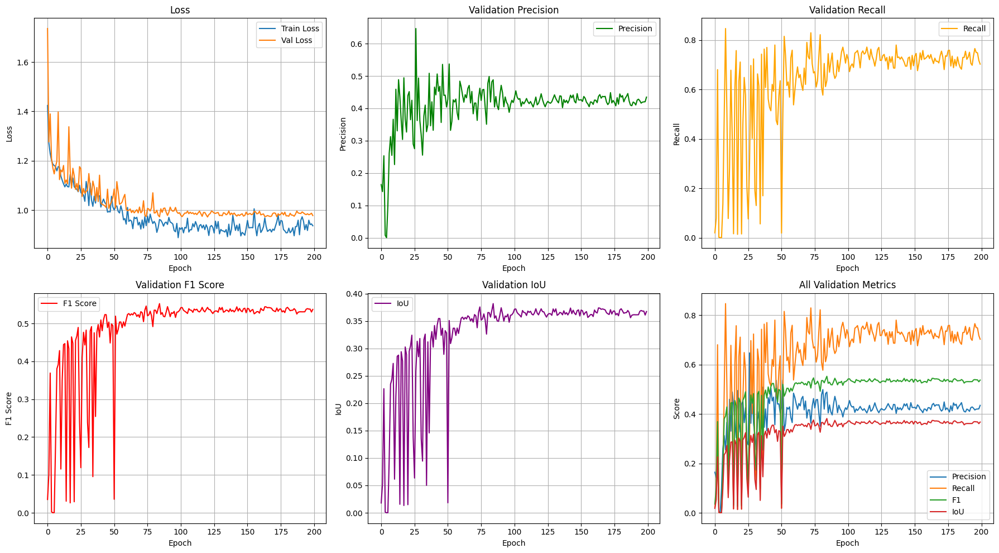

✅ Training history plotted!


In [ ]:
# Cell 8: Plot Training History

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Loss
axes[0, 0].plot(history['train_loss'], label='Train Loss')
axes[0, 0].plot(history['val_loss'], label='Val Loss')
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

# Precision
axes[0, 1].plot(history['val_precision'], label='Precision', color='green')
axes[0, 1].set_title('Validation Precision')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Precision')
axes[0, 1].legend()
axes[0, 1].grid(True)

# Recall
axes[0, 2].plot(history['val_recall'], label='Recall', color='orange')
axes[0, 2].set_title('Validation Recall')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('Recall')
axes[0, 2].legend()
axes[0, 2].grid(True)

# F1 Score
axes[1, 0].plot(history['val_f1'], label='F1 Score', color='red')
axes[1, 0].set_title('Validation F1 Score')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('F1 Score')
axes[1, 0].legend()
axes[1, 0].grid(True)

# IoU
axes[1, 1].plot(history['val_iou'], label='IoU', color='purple')
axes[1, 1].set_title('Validation IoU')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('IoU')
axes[1, 1].legend()
axes[1, 1].grid(True)

# Combined metrics
axes[1, 2].plot(history['val_precision'], label='Precision')
axes[1, 2].plot(history['val_recall'], label='Recall')
axes[1, 2].plot(history['val_f1'], label='F1')
axes[1, 2].plot(history['val_iou'], label='IoU')
axes[1, 2].set_title('All Validation Metrics')
axes[1, 2].set_xlabel('Epoch')
axes[1, 2].set_ylabel('Score')
axes[1, 2].legend()
axes[1, 2].grid(True)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, 'training_history.png'), dpi=150)
plt.show()

print("✅ Training history plotted!")

In [ ]:
# Cell 9: Load Best Model and Make Predictions

# Define the path to load the best model from Google Drive
best_model_drive_path = os.path.join(DATASET_BASE_DIR, 'best_tilted_roof_model.pth')

# Load best model
# Use weights_only=False to allow loading of numpy objects saved in the checkpoint
checkpoint = torch.load(best_model_drive_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f"✅ Loaded best model from epoch {checkpoint['epoch']} (IoU: {checkpoint['val_iou']:.4f})")

# Select a sample from validation set for visualization
val_indices = val_dataset.indices
sample_idx = random.choice(val_indices)
sample = full_dataset[sample_idx]

# Get original image and mask
image_path = Path(IMAGES_DIR) / f"{sample['name']}.png"
mask_path = Path(MASKS_DIR) / f"{sample['name']}.npy"

original_image = np.array(Image.open(image_path).convert('RGB'))
original_mask = np.load(mask_path)
if original_mask.max() > 1:
    original_mask = original_mask / 255.0
original_mask = original_mask.astype(np.float32)

# Preprocess image for inference
transform = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

image_np = original_image.astype(np.uint8)
transformed = transform(image=image_np)
image_tensor = transformed['image'].unsqueeze(0).to(device)

# Make prediction
with torch.no_grad():
    output = model(image_tensor)
    pred_prob = torch.sigmoid(output).cpu().numpy()[0, 0]
    pred_mask = (pred_prob > 0.5).astype(np.float32)

print(f"Sample: {sample['name']}")
print(f"Image shape: {original_image.shape}")
print(f"Predicted mask shape: {pred_mask.shape}")
print(f"Actual mask shape: {original_mask.shape}")

# Calculate metrics for this sample
pred_flat = pred_mask.flatten()
target_flat = original_mask.flatten()
precision = precision_score(target_flat, pred_flat, zero_division=0)
recall = recall_score(target_flat, pred_flat, zero_division=0)
f1 = f1_score(target_flat, pred_flat, zero_division=0)
iou = jaccard_score(target_flat, pred_flat, zero_division=0)

print(f"\nMetrics for this sample:")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")
print(f"  F1 Score: {f1:.4f}")
print(f"  IoU: {iou:.4f}")

✅ Loaded best model from epoch 85 (IoU: 0.3816)
Sample: 402_6
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)

Metrics for this sample:
  Precision: 0.3218
  Recall: 0.9200
  F1 Score: 0.4768
  IoU: 0.3131


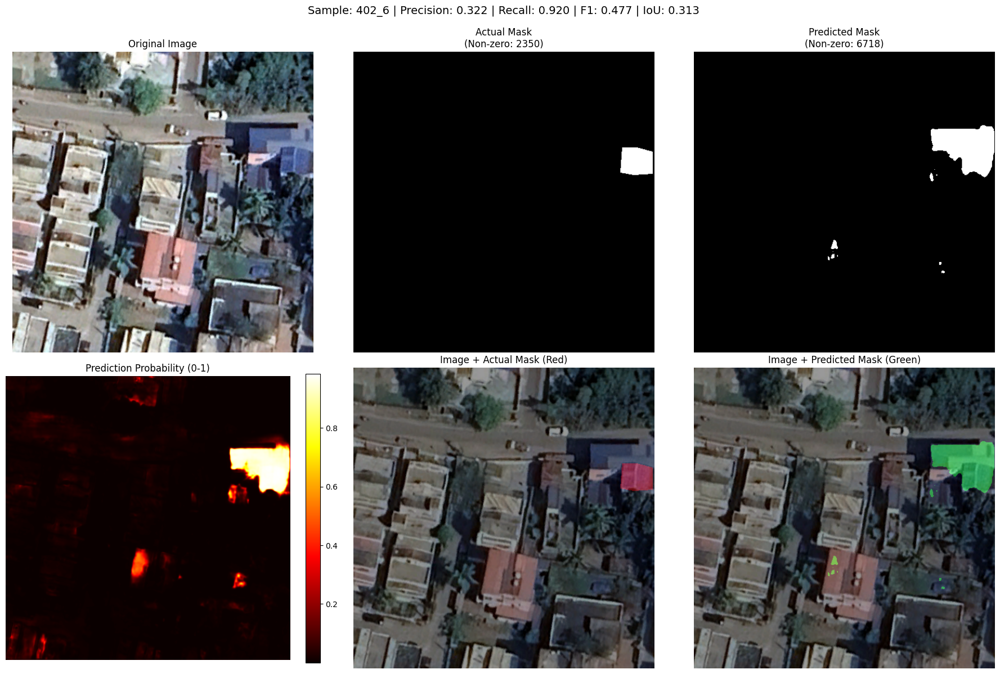

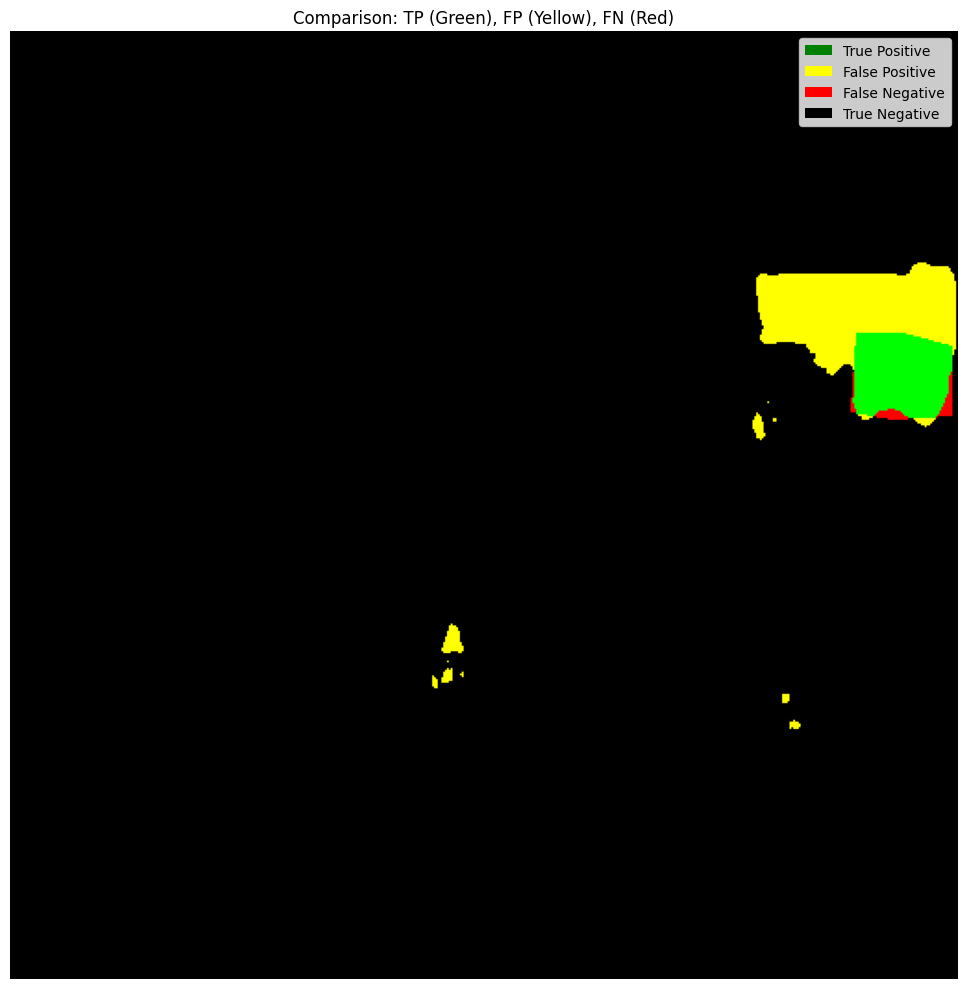

✅ Visualizations saved!


In [ ]:
# Cell 10: Visualize Prediction vs Actual Mask

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Original Image
axes[0, 0].imshow(original_image)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Actual Mask
axes[0, 1].imshow(original_mask, cmap='gray')
axes[0, 1].set_title(f'Actual Mask\n(Non-zero: {np.count_nonzero(original_mask)})')
axes[0, 1].axis('off')

# Predicted Mask
axes[0, 2].imshow(pred_mask, cmap='gray')
axes[0, 2].set_title(f'Predicted Mask\n(Non-zero: {np.count_nonzero(pred_mask)})')
axes[0, 2].axis('off')

# Prediction Probability
axes[1, 0].imshow(pred_prob, cmap='hot')
axes[1, 0].set_title('Prediction Probability (0-1)')
axes[1, 0].axis('off')
plt.colorbar(axes[1, 0].images[0], ax=axes[1, 0], fraction=0.046)

# Overlay on Image - Actual
overlay = original_image.copy().astype(np.float32)
if original_mask.max() > 0:
    mask_colored = np.zeros_like(original_image)
    mask_colored[original_mask > 0.5] = [255, 0, 0]  # Red for actual
    overlay = overlay * 0.6 + mask_colored * 0.4
    overlay = overlay.astype(np.uint8)
axes[1, 1].imshow(overlay)
axes[1, 1].set_title('Image + Actual Mask (Red)')
axes[1, 1].axis('off')

# Prediction Overlay on Image
pred_overlay = original_image.copy().astype(np.float32)
if pred_mask.max() > 0:
    pred_colored = np.zeros_like(original_image)
    pred_colored[pred_mask > 0.5] = [0, 255, 0]  # Green for predicted
    pred_overlay = pred_overlay * 0.6 + pred_colored * 0.4
    pred_overlay = pred_overlay.astype(np.uint8)
axes[1, 2].imshow(pred_overlay)
axes[1, 2].set_title('Image + Predicted Mask (Green)')
axes[1, 2].axis('off')

plt.suptitle(f'Sample: {sample["name"]} | Precision: {precision:.3f} | Recall: {recall:.3f} | F1: {f1:.3f} | IoU: {iou:.3f}',
             fontsize=14, y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, f'prediction_comparison_{sample["name"]}.png'), dpi=150, bbox_inches='tight')
plt.show()

# Create comparison mask (TP=green, FP=yellow, FN=red)
comparison_mask = np.zeros((*original_mask.shape, 3), dtype=np.uint8)
comparison_mask[(original_mask > 0.5) & (pred_mask > 0.5)] = [0, 255, 0]  # TP: Green
comparison_mask[(original_mask <= 0.5) & (pred_mask > 0.5)] = [255, 255, 0]  # FP: Yellow
comparison_mask[(original_mask > 0.5) & (pred_mask <= 0.5)] = [255, 0, 0]  # FN: Red

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(comparison_mask)
ax.set_title('Comparison: TP (Green), FP (Yellow), FN (Red)')
ax.axis('off')

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', label='True Positive'),
    Patch(facecolor='yellow', label='False Positive'),
    Patch(facecolor='red', label='False Negative'),
    Patch(facecolor='black', label='True Negative')
]
ax.legend(handles=legend_elements, loc='upper right')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, f'comparison_mask_{sample["name"]}.png'), dpi=150, bbox_inches='tight')
plt.show()

print("✅ Visualizations saved!")


In [ ]:
# Cell 11: Batch Inference Function

def batch_inference(model, images_dir, output_dir, device, threshold=0.5):
    """Run inference on all images in a directory"""
    model.eval()
    images_dir = Path(images_dir)
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    # Get all image files
    image_files = sorted(list(images_dir.glob('*.png')))

    print(f"Running inference on {len(image_files)} images...")

    transform = A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

    results = []

    for img_path in tqdm(image_files):
        # Load image
        image = np.array(Image.open(img_path).convert('RGB')).astype(np.uint8)
        original_image = image.copy()

        # Preprocess
        transformed = transform(image=image)
        image_tensor = transformed['image'].unsqueeze(0).to(device)

        # Predict
        with torch.no_grad():
            output = model(image_tensor)
            pred_prob = torch.sigmoid(output).cpu().numpy()[0, 0]
            pred_mask = (pred_prob > threshold).astype(np.uint8) * 255

        # Save prediction mask
        pred_save_path = output_dir / f"{img_path.stem}_pred.png"
        Image.fromarray(pred_mask).save(pred_save_path)

        # Save probability heatmap
        prob_heatmap = (pred_prob * 255).astype(np.uint8)
        prob_save_path = output_dir / f"{img_path.stem}_prob.png"
        Image.fromarray(prob_heatmap).save(prob_save_path)

        # Create overlay visualization
        overlay = original_image.copy().astype(np.float32)
        pred_colored = np.zeros_like(original_image)
        pred_colored[pred_mask > 0] = [0, 255, 0]  # Green
        overlay = overlay * 0.7 + pred_colored * 0.3
        overlay = overlay.astype(np.uint8)

        overlay_save_path = output_dir / f"{img_path.stem}_overlay.png"
        Image.fromarray(overlay).save(overlay_save_path)

        # Calculate statistics
        coverage = np.sum(pred_mask > 0) / (pred_mask.shape[0] * pred_mask.shape[1]) * 100
        results.append({
            'image': img_path.name,
            'coverage_percent': coverage,
            'predicted_pixels': np.sum(pred_mask > 0)
        })

    print(f"✅ Inference complete! Results saved to {output_dir}")
    return results

# Run batch inference (uncomment to use)
inference_results = batch_inference(
    model=model,
    images_dir=IMAGES_DIR,
    output_dir=os.path.join(output_dir, 'inference_results'),
    device=device,
    threshold=0.5
)

print("✅ Batch inference function ready!")

Running inference on 90 images...


100%|██████████| 90/90 [00:23<00:00,  3.80it/s]

✅ Inference complete! Results saved to tilted_roof_simple_outputs/inference_results
✅ Batch inference function ready!
Uncomment the code above to run inference on all images.


In [ ]:
import os
import shutil

# Define the directory where the inference results are currently saved
# This should be the same as the NEW_INFERENCE_OUTPUT_DIR used in the previous inference step
current_inference_dir = NEW_INFERENCE_OUTPUT_DIR # Using the variable from previous cell

# Define the base output directory where the new organized folders will be created
organized_output_dir = os.path.join(DATASET_BASE_DIR, 'organized_inference_results')

# Create the new subdirectories
pred_output_dir = os.path.join(organized_output_dir, 'predictions')
prob_output_dir = os.path.join(organized_output_dir, 'probabilities')
overlay_output_dir = os.path.join(organized_output_dir, 'overlays')

os.makedirs(pred_output_dir, exist_ok=True)
os.makedirs(prob_output_dir, exist_ok=True)
os.makedirs(overlay_output_dir, exist_ok=True)

print(f"Organizing images from: {current_inference_dir}")
print(f"Saving organized images to: {organized_output_dir}")

# Iterate through the files in the current inference directory
for filename in os.listdir(current_inference_dir):
    file_path = os.path.join(current_inference_dir, filename)

    # Check if it's a file and not a directory
    if os.path.isfile(file_path):
        # Determine the type of image based on the filename suffix
        if filename.endswith('_pred.png'):
            destination_dir = pred_output_dir
        elif filename.endswith('_prob.png'):
            destination_dir = prob_output_dir
        elif filename.endswith('_overlay.png'):
            destination_dir = overlay_output_dir
        else:
            # Skip files that don't match the expected naming convention
            print(f"Skipping unknown file type: {filename}")
            continue

        # Move the file to the appropriate subdirectory
        shutil.move(file_path, os.path.join(destination_dir, filename))

print("\n✅ Image organization complete!")

Organizing images from: /content/drive/MyDrive/Resume/tilted_roofs_inference_results
Saving organized images to: /content/drive/MyDrive/Resume/organized_inference_results

✅ Image organization complete!


In [ ]:
# Load the best model from Google Drive
best_model_drive_path = os.path.join(DATASET_BASE_DIR, 'best_tilted_roof_model.pth')

if not os.path.exists(best_model_drive_path):
    raise FileNotFoundError(f"Best model checkpoint not found at {best_model_drive_path}")

checkpoint = torch.load(best_model_drive_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f"✅ Loaded best model from epoch {checkpoint['epoch']} (IoU: {checkpoint['val_iou']:.4f}) for inference.")

# Define the directory containing the new images for inference
NEW_IMAGES_DIR = '/content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images'

# Define an output directory for the new inference results
NEW_INFERENCE_OUTPUT_DIR = os.path.join(DATASET_BASE_DIR, 'tilted_roofs_inference_results')

# Run batch inference on the new images
inference_results_new = batch_inference(
    model=model,
    images_dir=NEW_IMAGES_DIR,
    output_dir=NEW_INFERENCE_OUTPUT_DIR,
    device=device,
    threshold=0.5  # You can adjust the threshold if needed
)

print("\n✅ Batch inference on new images complete!")
print(f"Results saved to: {NEW_INFERENCE_OUTPUT_DIR}")

✅ Loaded best model from epoch 85 (IoU: 0.3816) for inference.
Running inference on 360 images...


100%|██████████| 360/360 [01:54<00:00,  3.15it/s]

✅ Inference complete! Results saved to /content/drive/MyDrive/Resume/tilted_roofs_inference_results

✅ Batch inference on new images complete!
Results saved to: /content/drive/MyDrive/Resume/tilted_roofs_inference_results


In [ ]:
!zip -r /content/tilted_roof_simple_outputs /content/tilted_roof_simple_outputs

  adding: content/tilted_roof_simple_outputs/ (stored 0%)
  adding: content/tilted_roof_simple_outputs/training_history.png (deflated 5%)
  adding: content/tilted_roof_simple_outputs/checkpoint_epoch_30.pth (deflated 8%)
  adding: content/tilted_roof_simple_outputs/checkpoint_epoch_50.pth (deflated 8%)
  adding: content/tilted_roof_simple_outputs/best_model.pth (deflated 8%)
  adding: content/tilted_roof_simple_outputs/comparison_mask_415_1.png (deflated 14%)
  adding: content/tilted_roof_simple_outputs/inference_results/ (stored 0%)
  adding: content/tilted_roof_simple_outputs/inference_results/1_5_overlay.png (deflated 0%)
  adding: content/tilted_roof_simple_outputs/inference_results/11_1_overlay.png (deflated 0%)
  adding: content/tilted_roof_simple_outputs/inference_results/401_1_pred.png (deflated 30%)
  adding: content/tilted_roof_simple_outputs/inference_results/215_3_pred.png (deflated 3%)
  adding: content/tilted_roof_simple_outputs/inference_results/414_3_pred.png (deflated 

In [ ]:
from google.colab import files
files.download('/content/tilted_roof_simple_outputs.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Cell 12: Continue Training

# Load the best model checkpoint
best_model_path = os.path.join(output_dir, 'best_model.pth')
if not os.path.exists(best_model_path):
    raise FileNotFoundError(f"Best model checkpoint not found at {best_model_path}")

checkpoint = torch.load(best_model_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Load training history
history = checkpoint.get('history', history) # Use existing history if not in checkpoint

print(f"✅ Loaded model and optimizer from epoch {checkpoint['epoch']} to continue training.")
print(f"Starting training from epoch {checkpoint['epoch'] + 1}")

# Continue training configuration
START_EPOCH = checkpoint['epoch'] + 1
CONTINUE_NUM_EPOCHS = 50
TOTAL_EPOCHS = START_EPOCH + CONTINUE_NUM_EPOCHS

# Adjust learning rate scheduler based on the loaded state (optional, but good practice)
# You might need to re-initialize or adjust the scheduler based on your needs
# For simplicity, we'll re-initialize it here, but you might want to load its state too
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Resume training loop
print(f"🚀 Resuming training for {CONTINUE_NUM_EPOCHS} more epochs...")

for epoch in range(START_EPOCH, TOTAL_EPOCHS + 1):
    print(f"\n{'='*60}")
    print(f"Epoch {epoch}/{TOTAL_EPOCHS}")
    print(f"{'='*60}")

    # Train
    train_loss = train_epoch(model, train_loader, optimizer, criterion, device)

    # Validate
    val_metrics = validate(model, val_loader, criterion, device)

    # Update learning rate
    scheduler.step(val_metrics['loss'])

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_metrics['loss'])
    history['val_precision'].append(val_metrics['precision'])
    history['val_recall'].append(val_metrics['recall'])
    history['val_f1'].append(val_metrics['f1'])
    history['val_iou'].append(val_metrics['iou'])

    # Print metrics
    print(f"\nTrain Loss: {train_loss:.4f}")
    print(f"Val Loss: {val_metrics['loss']:.4f}")
    print(f"Precision: {val_metrics['precision']:.4f}")
    print(f"Recall: {val_metrics['recall']:.4f}")
    print(f"F1 Score: {val_metrics['f1']:.4f}")
    print(f"IoU: {val_metrics['iou']:.4f}")

    # Save best model (update if current IoU is better)
    if val_metrics['iou'] > best_iou:
        best_iou = val_metrics['iou']
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_iou': val_metrics['iou'],
            'history': history
        }, best_model_path)
        print(f"✅ Saved best model (IoU: {best_iou:.4f})")

    # Save checkpoint every 10 epochs
    if epoch % 10 == 0:
        checkpoint_path = os.path.join(output_dir, f'checkpoint_epoch_{epoch}.pth')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'history': history
        }, checkpoint_path)

print(f"\n✅ Training complete!")
print(f"Best IoU: {best_iou:.4f}")
print(f"Best model saved at: {best_model_path}")

✅ Loaded model and optimizer from epoch 49 to continue training.
Starting training from epoch 50
🚀 Resuming training for 50 more epochs...

Epoch 50/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]



Train Loss: 0.9859
Val Loss: 0.9863
Precision: 0.4109
Recall: 0.7253
F1 Score: 0.5246
IoU: 0.3555
✅ Saved best model (IoU: 0.3555)

Epoch 51/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]



Train Loss: 1.0084
Val Loss: 0.9909
Precision: 0.3989
Recall: 0.7445
F1 Score: 0.5195
IoU: 0.3509

Epoch 52/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]



Train Loss: 1.0030
Val Loss: 0.9940
Precision: 0.4198
Recall: 0.4978
F1 Score: 0.4555
IoU: 0.2949

Epoch 53/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 1.0539
Val Loss: 0.9948
Precision: 0.4427
Recall: 0.5819
F1 Score: 0.5029
IoU: 0.3359

Epoch 54/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]



Train Loss: 1.0127
Val Loss: 1.0191
Precision: 0.3868
Recall: 0.7577
F1 Score: 0.5122
IoU: 0.3442

Epoch 55/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]



Train Loss: 0.9974
Val Loss: 1.0194
Precision: 0.3843
Recall: 0.7884
F1 Score: 0.5167
IoU: 0.3484

Epoch 56/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]



Train Loss: 0.9783
Val Loss: 1.0046
Precision: 0.4089
Recall: 0.7302
F1 Score: 0.5242
IoU: 0.3552

Epoch 57/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]



Train Loss: 0.9955
Val Loss: 1.0028
Precision: 0.3940
Recall: 0.7852
F1 Score: 0.5247
IoU: 0.3556
✅ Saved best model (IoU: 0.3556)

Epoch 58/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]



Train Loss: 0.9623
Val Loss: 0.9966
Precision: 0.3953
Recall: 0.7757
F1 Score: 0.5237
IoU: 0.3548

Epoch 59/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.87it/s]



Train Loss: 1.0075
Val Loss: 0.9952
Precision: 0.3970
Recall: 0.7643
F1 Score: 0.5226
IoU: 0.3537

Epoch 60/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]



Train Loss: 0.9555
Val Loss: 0.9929
Precision: 0.4124
Recall: 0.7105
F1 Score: 0.5219
IoU: 0.3531

Epoch 61/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]



Train Loss: 0.9954
Val Loss: 0.9845
Precision: 0.4141
Recall: 0.7062
F1 Score: 0.5220
IoU: 0.3532

Epoch 62/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.92it/s]



Train Loss: 0.9770
Val Loss: 0.9864
Precision: 0.4116
Recall: 0.7272
F1 Score: 0.5256
IoU: 0.3565
✅ Saved best model (IoU: 0.3565)

Epoch 63/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]



Train Loss: 0.9893
Val Loss: 0.9840
Precision: 0.4048
Recall: 0.7591
F1 Score: 0.5280
IoU: 0.3587
✅ Saved best model (IoU: 0.3587)

Epoch 64/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]



Train Loss: 0.9750
Val Loss: 0.9761
Precision: 0.4148
Recall: 0.7343
F1 Score: 0.5301
IoU: 0.3607
✅ Saved best model (IoU: 0.3607)

Epoch 65/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.87it/s]



Train Loss: 0.9791
Val Loss: 0.9800
Precision: 0.4105
Recall: 0.7495
F1 Score: 0.5305
IoU: 0.3610
✅ Saved best model (IoU: 0.3610)

Epoch 66/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]



Train Loss: 0.9665
Val Loss: 0.9872
Precision: 0.4025
Recall: 0.7786
F1 Score: 0.5307
IoU: 0.3612
✅ Saved best model (IoU: 0.3612)

Epoch 67/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]



Train Loss: 1.0151
Val Loss: 0.9788
Precision: 0.4081
Recall: 0.7577
F1 Score: 0.5304
IoU: 0.3610

Epoch 68/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.96it/s]



Train Loss: 0.9491
Val Loss: 0.9966
Precision: 0.3913
Recall: 0.7951
F1 Score: 0.5245
IoU: 0.3554

Epoch 69/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]



Train Loss: 0.9732
Val Loss: 0.9958
Precision: 0.4001
Recall: 0.7702
F1 Score: 0.5267
IoU: 0.3575

Epoch 70/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]



Train Loss: 0.9915
Val Loss: 0.9791
Precision: 0.4129
Recall: 0.7587
F1 Score: 0.5348
IoU: 0.3650
✅ Saved best model (IoU: 0.3650)

Epoch 71/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.96it/s]



Train Loss: 1.0096
Val Loss: 0.9864
Precision: 0.4026
Recall: 0.7900
F1 Score: 0.5334
IoU: 0.3637

Epoch 72/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.9885
Val Loss: 0.9795
Precision: 0.4134
Recall: 0.7581
F1 Score: 0.5350
IoU: 0.3652
✅ Saved best model (IoU: 0.3652)

Epoch 73/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]



Train Loss: 0.9995
Val Loss: 0.9817
Precision: 0.4250
Recall: 0.7332
F1 Score: 0.5381
IoU: 0.3681
✅ Saved best model (IoU: 0.3681)

Epoch 74/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.85it/s]



Train Loss: 0.9725
Val Loss: 0.9821
Precision: 0.4118
Recall: 0.7659
F1 Score: 0.5356
IoU: 0.3658

Epoch 75/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]



Train Loss: 0.9673
Val Loss: 0.9939
Precision: 0.3959
Recall: 0.7950
F1 Score: 0.5285
IoU: 0.3592

Epoch 76/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]



Train Loss: 0.9649
Val Loss: 0.9954
Precision: 0.3876
Recall: 0.8095
F1 Score: 0.5242
IoU: 0.3552

Epoch 77/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.90it/s]



Train Loss: 0.9471
Val Loss: 0.9910
Precision: 0.3926
Recall: 0.8042
F1 Score: 0.5276
IoU: 0.3584

Epoch 78/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]



Train Loss: 0.9650
Val Loss: 0.9755
Precision: 0.4147
Recall: 0.7586
F1 Score: 0.5363
IoU: 0.3664

Epoch 79/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]



Train Loss: 0.9914
Val Loss: 0.9731
Precision: 0.4260
Recall: 0.7360
F1 Score: 0.5397
IoU: 0.3696
✅ Saved best model (IoU: 0.3696)

Epoch 80/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]



Train Loss: 0.9435
Val Loss: 0.9757
Precision: 0.4149
Recall: 0.7629
F1 Score: 0.5375
IoU: 0.3675

Epoch 81/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]



Train Loss: 0.9741
Val Loss: 0.9771
Precision: 0.4181
Recall: 0.7592
F1 Score: 0.5392
IoU: 0.3691

Epoch 82/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]



Train Loss: 0.9609
Val Loss: 0.9713
Precision: 0.4257
Recall: 0.7412
F1 Score: 0.5408
IoU: 0.3706
✅ Saved best model (IoU: 0.3706)

Epoch 83/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]



Train Loss: 0.9854
Val Loss: 0.9753
Precision: 0.4147
Recall: 0.7632
F1 Score: 0.5374
IoU: 0.3674

Epoch 84/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]



Train Loss: 0.9734
Val Loss: 0.9866
Precision: 0.4036
Recall: 0.7866
F1 Score: 0.5335
IoU: 0.3638

Epoch 85/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]



Train Loss: 0.9805
Val Loss: 0.9780
Precision: 0.4093
Recall: 0.7756
F1 Score: 0.5358
IoU: 0.3660

Epoch 86/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]



Train Loss: 0.9648
Val Loss: 0.9708
Precision: 0.4172
Recall: 0.7665
F1 Score: 0.5403
IoU: 0.3701

Epoch 87/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]



Train Loss: 0.9504
Val Loss: 0.9774
Precision: 0.4083
Recall: 0.7887
F1 Score: 0.5380
IoU: 0.3680

Epoch 88/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]



Train Loss: 0.9508
Val Loss: 0.9787
Precision: 0.4097
Recall: 0.7859
F1 Score: 0.5387
IoU: 0.3686

Epoch 89/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]



Train Loss: 0.9897
Val Loss: 0.9780
Precision: 0.4033
Recall: 0.7979
F1 Score: 0.5358
IoU: 0.3659

Epoch 90/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]



Train Loss: 0.9412
Val Loss: 0.9852
Precision: 0.3988
Recall: 0.8052
F1 Score: 0.5334
IoU: 0.3637

Epoch 91/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]



Train Loss: 0.9630
Val Loss: 0.9909
Precision: 0.3982
Recall: 0.8050
F1 Score: 0.5328
IoU: 0.3632

Epoch 92/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]



Train Loss: 0.9792
Val Loss: 0.9654
Precision: 0.4218
Recall: 0.7543
F1 Score: 0.5411
IoU: 0.3709
✅ Saved best model (IoU: 0.3709)

Epoch 93/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]



Train Loss: 0.9641
Val Loss: 0.9667
Precision: 0.4222
Recall: 0.7592
F1 Score: 0.5427
IoU: 0.3724
✅ Saved best model (IoU: 0.3724)

Epoch 94/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]



Train Loss: 1.0095
Val Loss: 0.9798
Precision: 0.4079
Recall: 0.7879
F1 Score: 0.5375
IoU: 0.3675

Epoch 95/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]



Train Loss: 0.9498
Val Loss: 0.9843
Precision: 0.4025
Recall: 0.7942
F1 Score: 0.5342
IoU: 0.3644

Epoch 96/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]



Train Loss: 0.9634
Val Loss: 0.9869
Precision: 0.3980
Recall: 0.8052
F1 Score: 0.5327
IoU: 0.3630

Epoch 97/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]



Train Loss: 0.9804
Val Loss: 0.9799
Precision: 0.4030
Recall: 0.7883
F1 Score: 0.5334
IoU: 0.3637

Epoch 98/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]



Train Loss: 0.9456
Val Loss: 0.9755
Precision: 0.4097
Recall: 0.7742
F1 Score: 0.5358
IoU: 0.3660

Epoch 99/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]



Train Loss: 0.9180
Val Loss: 0.9821
Precision: 0.4023
Recall: 0.7864
F1 Score: 0.5323
IoU: 0.3627

Epoch 100/100


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.87it/s]



Train Loss: 0.9448
Val Loss: 0.9815
Precision: 0.4039
Recall: 0.7870
F1 Score: 0.5339
IoU: 0.3641

✅ Training complete!
Best IoU: 0.3724
Best model saved at: tilted_roof_simple_outputs/best_model.pth


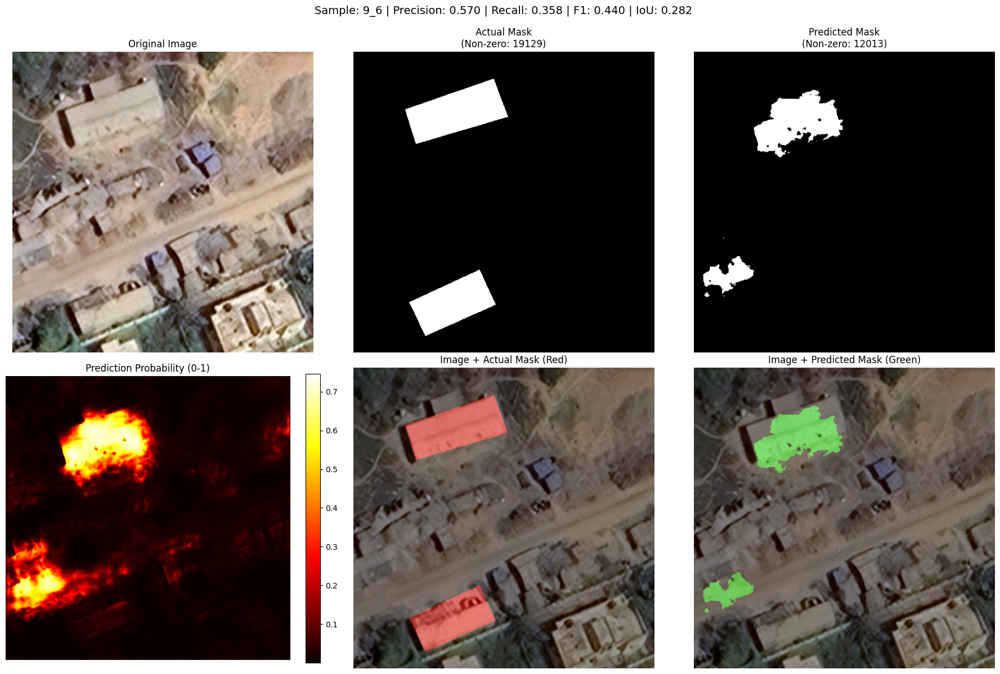

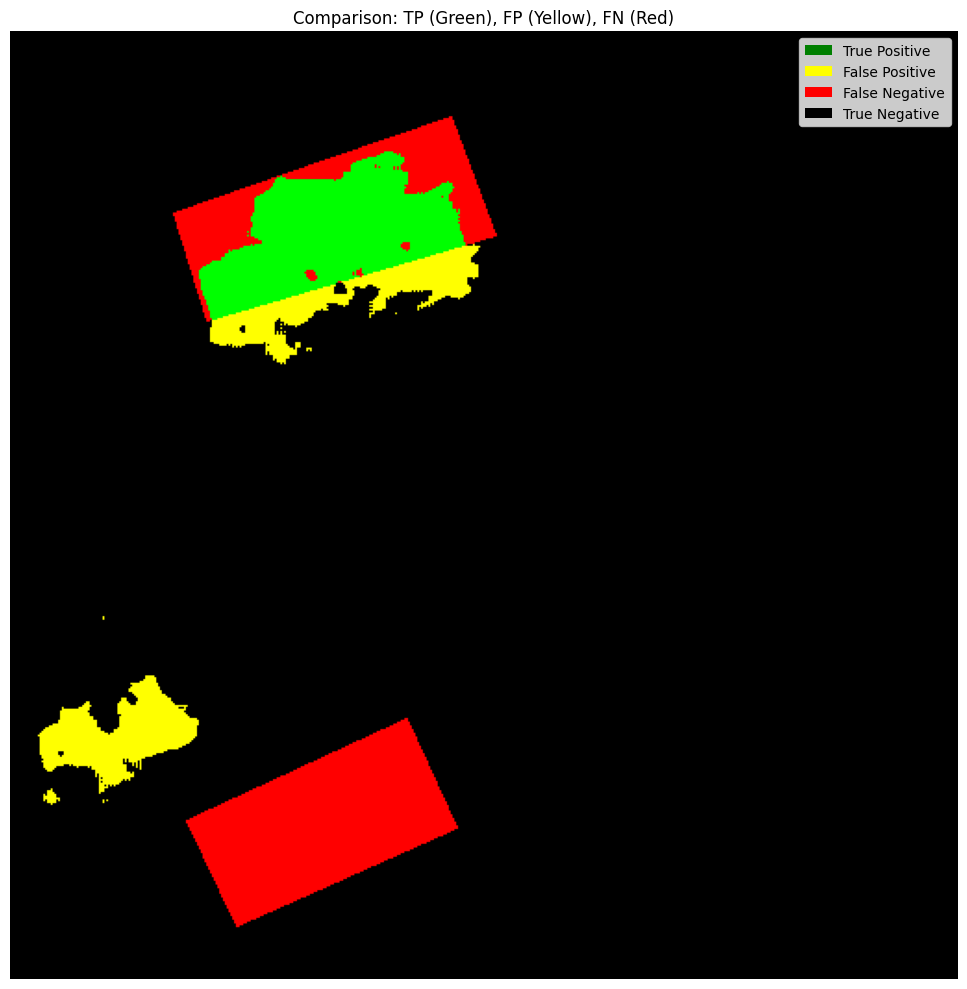

✅ Visualizations saved!


In [ ]:
# Cell 10: Visualize Prediction vs Actual Mask

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Original Image
axes[0, 0].imshow(original_image)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Actual Mask
axes[0, 1].imshow(original_mask, cmap='gray')
axes[0, 1].set_title(f'Actual Mask\n(Non-zero: {np.count_nonzero(original_mask)})')
axes[0, 1].axis('off')

# Predicted Mask
axes[0, 2].imshow(pred_mask, cmap='gray')
axes[0, 2].set_title(f'Predicted Mask\n(Non-zero: {np.count_nonzero(pred_mask)})')
axes[0, 2].axis('off')

# Prediction Probability
axes[1, 0].imshow(pred_prob, cmap='hot')
axes[1, 0].set_title('Prediction Probability (0-1)')
axes[1, 0].axis('off')
plt.colorbar(axes[1, 0].images[0], ax=axes[1, 0], fraction=0.046)

# Overlay on Image - Actual
overlay = original_image.copy().astype(np.float32)
if original_mask.max() > 0:
    mask_colored = np.zeros_like(original_image)
    mask_colored[original_mask > 0.5] = [255, 0, 0]  # Red for actual
    overlay = overlay * 0.6 + mask_colored * 0.4
    overlay = overlay.astype(np.uint8)
axes[1, 1].imshow(overlay)
axes[1, 1].set_title('Image + Actual Mask (Red)')
axes[1, 1].axis('off')

# Prediction Overlay on Image
pred_overlay = original_image.copy().astype(np.float32)
if pred_mask.max() > 0:
    pred_colored = np.zeros_like(original_image)
    pred_colored[pred_mask > 0.5] = [0, 255, 0]  # Green for predicted
    pred_overlay = pred_overlay * 0.6 + pred_colored * 0.4
    pred_overlay = pred_overlay.astype(np.uint8)
axes[1, 2].imshow(pred_overlay)
axes[1, 2].set_title('Image + Predicted Mask (Green)')
axes[1, 2].axis('off')

plt.suptitle(f'Sample: {sample["name"]} | Precision: {precision:.3f} | Recall: {recall:.3f} | F1: {f1:.3f} | IoU: {iou:.3f}',
             fontsize=14, y=0.995)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, f'prediction_comparison_{sample["name"]}.png'), dpi=150, bbox_inches='tight')
plt.show()

# Create comparison mask (TP=green, FP=yellow, FN=red)
comparison_mask = np.zeros((*original_mask.shape, 3), dtype=np.uint8)
comparison_mask[(original_mask > 0.5) & (pred_mask > 0.5)] = [0, 255, 0]  # TP: Green
comparison_mask[(original_mask <= 0.5) & (pred_mask > 0.5)] = [255, 255, 0]  # FP: Yellow
comparison_mask[(original_mask > 0.5) & (pred_mask <= 0.5)] = [255, 0, 0]  # FN: Red

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(comparison_mask)
ax.set_title('Comparison: TP (Green), FP (Yellow), FN (Red)')
ax.axis('off')

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', label='True Positive'),
    Patch(facecolor='yellow', label='False Positive'),
    Patch(facecolor='red', label='False Negative'),
    Patch(facecolor='black', label='True Negative')
]
ax.legend(handles=legend_elements, loc='upper right')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, f'comparison_mask_{sample["name"]}.png'), dpi=150, bbox_inches='tight')
plt.show()

print("✅ Visualizations saved!")

In [ ]:
# Cell 7: Training Loop

# Initialize model, loss, and optimizer
model = SimpleUNet(in_channels=3, out_channels=1).to(device)
criterion = CombinedLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Create output directory
output_dir = 'tilted_roof_simple_outputs'
os.makedirs(output_dir, exist_ok=True)

# Training configuration
NUM_EPOCHS = 200
best_iou = 0
best_model_path = os.path.join(output_dir, 'best_model.pth')

# Training history
history = {
    'train_loss': [],
    'val_loss': [],
    'val_precision': [],
    'val_recall': [],
    'val_f1': [],
    'val_iou': []
}

print("🚀 Starting training...")
print(f"Output directory: {output_dir}")
print(f"Training for {NUM_EPOCHS} epochs\n")

for epoch in range(1, NUM_EPOCHS + 1):
    print(f"\n{'='*60}")
    print(f"Epoch {epoch}/{NUM_EPOCHS}")
    print(f"{'='*60}")

    # Train
    train_loss = train_epoch(model, train_loader, optimizer, criterion, device)

    # Validate
    val_metrics = validate(model, val_loader, criterion, device)

    # Update learning rate
    scheduler.step(val_metrics['loss'])

    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_metrics['loss'])
    history['val_precision'].append(val_metrics['precision'])
    history['val_recall'].append(val_metrics['recall'])
    history['val_f1'].append(val_metrics['f1'])
    history['val_iou'].append(val_metrics['iou'])

    # Print metrics
    print(f"\nTrain Loss: {train_loss:.4f}")
    print(f"Val Loss: {val_metrics['loss']:.4f}")
    print(f"Precision: {val_metrics['precision']:.4f}")
    print(f"Recall: {val_metrics['recall']:.4f}")
    print(f"F1 Score: {val_metrics['f1']:.4f}")
    print(f"IoU: {val_metrics['iou']:.4f}")

    # Save best model
    if val_metrics['iou'] > best_iou:
        best_iou = val_metrics['iou']
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_iou': val_metrics['iou'],
            'history': history
        }, best_model_path)
        print(f"✅ Saved best model (IoU: {best_iou:.4f})")

    # Save checkpoint every 10 epochs
    if epoch % 10 == 0:
        checkpoint_path = os.path.join(output_dir, f'checkpoint_epoch_{epoch}.pth')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'history': history
        }, checkpoint_path)

print(f"\n✅ Training complete!")
print(f"Best IoU: {best_iou:.4f}")
print(f"Best model saved at: {best_model_path}")

🚀 Starting training...
Output directory: tilted_roof_simple_outputs
Training for 200 epochs


Epoch 1/200


Validating: 100%|██████████| 5/5 [00:12<00:00,  2.47s/it]



Train Loss: 1.4367
Val Loss: 2.3130
Precision: 0.1351
Recall: 0.7580
F1 Score: 0.2293
IoU: 0.1295
✅ Saved best model (IoU: 0.1295)

Epoch 2/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]



Train Loss: 1.2707
Val Loss: 1.3400
Precision: 0.2440
Recall: 0.7414
F1 Score: 0.3671
IoU: 0.2248
✅ Saved best model (IoU: 0.2248)

Epoch 3/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 1.2376
Val Loss: 1.2938
Precision: 0.3051
Recall: 0.6844
F1 Score: 0.4220
IoU: 0.2675
✅ Saved best model (IoU: 0.2675)

Epoch 4/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]



Train Loss: 1.1924
Val Loss: 1.2055
Precision: 0.3713
Recall: 0.6129
F1 Score: 0.4624
IoU: 0.3008
✅ Saved best model (IoU: 0.3008)

Epoch 5/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 1.1862
Val Loss: 1.2250
Precision: 0.1749
Recall: 0.0985
F1 Score: 0.1260
IoU: 0.0673

Epoch 6/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]



Train Loss: 1.1524
Val Loss: 1.1768
Precision: 0.3183
Recall: 0.8173
F1 Score: 0.4582
IoU: 0.2972

Epoch 7/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.80it/s]



Train Loss: 1.1860
Val Loss: 1.1465
Precision: 0.1823
Recall: 0.0312
F1 Score: 0.0532
IoU: 0.0273

Epoch 8/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 1.1372
Val Loss: 1.1816
Precision: 0.2931
Recall: 0.8449
F1 Score: 0.4353
IoU: 0.2782

Epoch 9/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.1292
Val Loss: 1.1170
Precision: 0.2785
Recall: 0.2463
F1 Score: 0.2614
IoU: 0.1503

Epoch 10/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.69it/s]



Train Loss: 1.1172
Val Loss: 1.1644
Precision: 0.2964
Recall: 0.8474
F1 Score: 0.4392
IoU: 0.2814

Epoch 11/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.0967
Val Loss: 1.0933
Precision: 0.3401
Recall: 0.7802
F1 Score: 0.4737
IoU: 0.3104
✅ Saved best model (IoU: 0.3104)

Epoch 12/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]



Train Loss: 1.0610
Val Loss: 1.1080
Precision: 0.3301
Recall: 0.0156
F1 Score: 0.0297
IoU: 0.0151

Epoch 13/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.69it/s]



Train Loss: 1.0716
Val Loss: 1.1310
Precision: 0.3198
Recall: 0.1889
F1 Score: 0.2375
IoU: 0.1348

Epoch 14/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.1051
Val Loss: 1.1266
Precision: 0.3159
Recall: 0.8206
F1 Score: 0.4561
IoU: 0.2955

Epoch 15/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.1022
Val Loss: 1.0889
Precision: 0.3264
Recall: 0.7697
F1 Score: 0.4584
IoU: 0.2973

Epoch 16/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 1.0676
Val Loss: 1.0867
Precision: 0.3392
Recall: 0.7894
F1 Score: 0.4745
IoU: 0.3111
✅ Saved best model (IoU: 0.3111)

Epoch 17/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 1.0426
Val Loss: 1.0907
Precision: 0.6200
Recall: 0.0271
F1 Score: 0.0519
IoU: 0.0266

Epoch 18/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 1.0588
Val Loss: 1.0519
Precision: 0.3782
Recall: 0.5628
F1 Score: 0.4524
IoU: 0.2923

Epoch 19/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 1.1032
Val Loss: 1.0745
Precision: 0.3343
Recall: 0.7915
F1 Score: 0.4701
IoU: 0.3073

Epoch 20/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]



Train Loss: 1.0629
Val Loss: 1.1051
Precision: 0.2922
Recall: 0.0465
F1 Score: 0.0802
IoU: 0.0418

Epoch 21/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 1.0479
Val Loss: 1.0392
Precision: 0.4151
Recall: 0.6413
F1 Score: 0.5040
IoU: 0.3369
✅ Saved best model (IoU: 0.3369)

Epoch 22/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 1.0843
Val Loss: 1.0410
Precision: 0.4648
Recall: 0.0575
F1 Score: 0.1024
IoU: 0.0539

Epoch 23/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.0621
Val Loss: 1.0882
Precision: 0.3509
Recall: 0.8421
F1 Score: 0.4954
IoU: 0.3293

Epoch 24/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]



Train Loss: 1.0685
Val Loss: 1.0697
Precision: 0.3431
Recall: 0.4554
F1 Score: 0.3914
IoU: 0.2433

Epoch 25/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 1.1211
Val Loss: 1.1883
Precision: 0.2799
Recall: 0.7561
F1 Score: 0.4086
IoU: 0.2568

Epoch 26/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]



Train Loss: 1.0529
Val Loss: 1.0450
Precision: 0.4294
Recall: 0.4977
F1 Score: 0.4610
IoU: 0.2996

Epoch 27/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 1.0494
Val Loss: 1.0840
Precision: 0.3445
Recall: 0.8311
F1 Score: 0.4871
IoU: 0.3220

Epoch 28/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.69it/s]



Train Loss: 1.0326
Val Loss: 1.0675
Precision: 0.3595
Recall: 0.8100
F1 Score: 0.4980
IoU: 0.3315

Epoch 29/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]



Train Loss: 1.0091
Val Loss: 1.0404
Precision: 0.5227
Recall: 0.2643
F1 Score: 0.3511
IoU: 0.2129

Epoch 30/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 1.0391
Val Loss: 1.0008
Precision: 0.5280
Recall: 0.4154
F1 Score: 0.4649
IoU: 0.3029

Epoch 31/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 0.9955
Val Loss: 1.0383
Precision: 0.3746
Recall: 0.8054
F1 Score: 0.5114
IoU: 0.3435
✅ Saved best model (IoU: 0.3435)

Epoch 32/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]



Train Loss: 1.0264
Val Loss: 1.0202
Precision: 0.5388
Recall: 0.4016
F1 Score: 0.4602
IoU: 0.2988

Epoch 33/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 1.0533
Val Loss: 1.0107
Precision: 0.4912
Recall: 0.4927
F1 Score: 0.4920
IoU: 0.3262

Epoch 34/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 1.0339
Val Loss: 1.0201
Precision: 0.4263
Recall: 0.6264
F1 Score: 0.5073
IoU: 0.3399

Epoch 35/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9978
Val Loss: 1.0124
Precision: 0.5069
Recall: 0.5023
F1 Score: 0.5046
IoU: 0.3374

Epoch 36/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.0293
Val Loss: 1.0282
Precision: 0.3859
Recall: 0.7777
F1 Score: 0.5159
IoU: 0.3476
✅ Saved best model (IoU: 0.3476)

Epoch 37/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 1.0092
Val Loss: 1.0094
Precision: 0.3979
Recall: 0.7249
F1 Score: 0.5137
IoU: 0.3457

Epoch 38/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9851
Val Loss: 0.9966
Precision: 0.4499
Recall: 0.5915
F1 Score: 0.5111
IoU: 0.3432

Epoch 39/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]



Train Loss: 0.9949
Val Loss: 1.0480
Precision: 0.3645
Recall: 0.8539
F1 Score: 0.5109
IoU: 0.3431

Epoch 40/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]



Train Loss: 0.9756
Val Loss: 0.9929
Precision: 0.4676
Recall: 0.6469
F1 Score: 0.5429
IoU: 0.3726
✅ Saved best model (IoU: 0.3726)

Epoch 41/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9666
Val Loss: 1.0173
Precision: 0.3981
Recall: 0.8122
F1 Score: 0.5343
IoU: 0.3645

Epoch 42/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.9457
Val Loss: 0.9996
Precision: 0.4651
Recall: 0.5705
F1 Score: 0.5124
IoU: 0.3445

Epoch 43/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]



Train Loss: 0.9790
Val Loss: 1.0730
Precision: 0.3565
Recall: 0.8683
F1 Score: 0.5055
IoU: 0.3382

Epoch 44/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 1.0012
Val Loss: 0.9773
Precision: 0.4673
Recall: 0.6400
F1 Score: 0.5402
IoU: 0.3701

Epoch 45/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9681
Val Loss: 1.0280
Precision: 0.3990
Recall: 0.7573
F1 Score: 0.5227
IoU: 0.3538

Epoch 46/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9594
Val Loss: 1.0184
Precision: 0.3920
Recall: 0.8293
F1 Score: 0.5323
IoU: 0.3627

Epoch 47/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9509
Val Loss: 0.9879
Precision: 0.5076
Recall: 0.6165
F1 Score: 0.5568
IoU: 0.3858
✅ Saved best model (IoU: 0.3858)

Epoch 48/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9600
Val Loss: 0.9758
Precision: 0.4707
Recall: 0.6912
F1 Score: 0.5600
IoU: 0.3889
✅ Saved best model (IoU: 0.3889)

Epoch 49/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9311
Val Loss: 0.9854
Precision: 0.4959
Recall: 0.5624
F1 Score: 0.5271
IoU: 0.3578

Epoch 50/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9421
Val Loss: 0.9879
Precision: 0.4685
Recall: 0.6674
F1 Score: 0.5506
IoU: 0.3798

Epoch 51/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]



Train Loss: 0.9614
Val Loss: 0.9867
Precision: 0.4532
Recall: 0.7015
F1 Score: 0.5506
IoU: 0.3799

Epoch 52/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.9445
Val Loss: 0.9990
Precision: 0.4691
Recall: 0.6460
F1 Score: 0.5435
IoU: 0.3732

Epoch 53/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9294
Val Loss: 1.0962
Precision: 0.3567
Recall: 0.8642
F1 Score: 0.5050
IoU: 0.3378

Epoch 54/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]



Train Loss: 0.9412
Val Loss: 0.9916
Precision: 0.4194
Recall: 0.7878
F1 Score: 0.5474
IoU: 0.3769

Epoch 55/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9301
Val Loss: 0.9794
Precision: 0.4755
Recall: 0.6997
F1 Score: 0.5662
IoU: 0.3949
✅ Saved best model (IoU: 0.3949)

Epoch 56/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9290
Val Loss: 0.9905
Precision: 0.5036
Recall: 0.5339
F1 Score: 0.5183
IoU: 0.3498

Epoch 57/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 0.9263
Val Loss: 0.9887
Precision: 0.4627
Recall: 0.7286
F1 Score: 0.5660
IoU: 0.3947

Epoch 58/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]



Train Loss: 0.9478
Val Loss: 0.9875
Precision: 0.4785
Recall: 0.7070
F1 Score: 0.5707
IoU: 0.3993
✅ Saved best model (IoU: 0.3993)

Epoch 59/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9432
Val Loss: 0.9928
Precision: 0.4466
Recall: 0.7496
F1 Score: 0.5597
IoU: 0.3886

Epoch 60/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]



Train Loss: 0.9242
Val Loss: 0.9883
Precision: 0.4440
Recall: 0.7630
F1 Score: 0.5613
IoU: 0.3902

Epoch 61/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.9105
Val Loss: 0.9869
Precision: 0.4575
Recall: 0.7489
F1 Score: 0.5680
IoU: 0.3967

Epoch 62/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8827
Val Loss: 0.9788
Precision: 0.4808
Recall: 0.7326
F1 Score: 0.5806
IoU: 0.4090
✅ Saved best model (IoU: 0.4090)

Epoch 63/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.78it/s]



Train Loss: 0.9080
Val Loss: 0.9749
Precision: 0.4815
Recall: 0.7194
F1 Score: 0.5769
IoU: 0.4053

Epoch 64/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9049
Val Loss: 0.9879
Precision: 0.4591
Recall: 0.7257
F1 Score: 0.5624
IoU: 0.3912

Epoch 65/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.8988
Val Loss: 0.9829
Precision: 0.4755
Recall: 0.7193
F1 Score: 0.5725
IoU: 0.4011

Epoch 66/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.86it/s]



Train Loss: 0.8855
Val Loss: 0.9815
Precision: 0.4889
Recall: 0.7139
F1 Score: 0.5804
IoU: 0.4088

Epoch 67/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.8832
Val Loss: 0.9901
Precision: 0.4388
Recall: 0.7818
F1 Score: 0.5621
IoU: 0.3909

Epoch 68/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.8883
Val Loss: 0.9716
Precision: 0.4995
Recall: 0.6988
F1 Score: 0.5826
IoU: 0.4110
✅ Saved best model (IoU: 0.4110)

Epoch 69/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8999
Val Loss: 0.9816
Precision: 0.4766
Recall: 0.7417
F1 Score: 0.5803
IoU: 0.4088

Epoch 70/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.9071
Val Loss: 1.0017
Precision: 0.4284
Recall: 0.7939
F1 Score: 0.5565
IoU: 0.3855

Epoch 71/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.9107
Val Loss: 0.9798
Precision: 0.4728
Recall: 0.7441
F1 Score: 0.5782
IoU: 0.4067

Epoch 72/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.9296
Val Loss: 0.9747
Precision: 0.5565
Recall: 0.6425
F1 Score: 0.5964
IoU: 0.4249
✅ Saved best model (IoU: 0.4249)

Epoch 73/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8936
Val Loss: 0.9867
Precision: 0.4767
Recall: 0.7431
F1 Score: 0.5808
IoU: 0.4092

Epoch 74/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 0.9075
Val Loss: 0.9851
Precision: 0.4652
Recall: 0.7579
F1 Score: 0.5765
IoU: 0.4050

Epoch 75/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8910
Val Loss: 0.9764
Precision: 0.4666
Recall: 0.7596
F1 Score: 0.5781
IoU: 0.4065

Epoch 76/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8870
Val Loss: 0.9776
Precision: 0.4731
Recall: 0.7431
F1 Score: 0.5781
IoU: 0.4066

Epoch 77/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.8717
Val Loss: 0.9737
Precision: 0.4938
Recall: 0.7161
F1 Score: 0.5845
IoU: 0.4129

Epoch 78/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.94it/s]



Train Loss: 0.8944
Val Loss: 0.9775
Precision: 0.4839
Recall: 0.7287
F1 Score: 0.5816
IoU: 0.4100

Epoch 79/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8994
Val Loss: 0.9718
Precision: 0.5153
Recall: 0.6995
F1 Score: 0.5935
IoU: 0.4219

Epoch 80/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.8878
Val Loss: 0.9773
Precision: 0.4992
Recall: 0.7124
F1 Score: 0.5871
IoU: 0.4155

Epoch 81/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.8935
Val Loss: 0.9837
Precision: 0.4630
Recall: 0.7611
F1 Score: 0.5758
IoU: 0.4043

Epoch 82/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8861
Val Loss: 0.9846
Precision: 0.4640
Recall: 0.7532
F1 Score: 0.5743
IoU: 0.4028

Epoch 83/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.80it/s]



Train Loss: 0.8696
Val Loss: 0.9914
Precision: 0.4446
Recall: 0.7731
F1 Score: 0.5646
IoU: 0.3933

Epoch 84/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8956
Val Loss: 0.9811
Precision: 0.4661
Recall: 0.7461
F1 Score: 0.5738
IoU: 0.4023

Epoch 85/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9057
Val Loss: 0.9768
Precision: 0.4782
Recall: 0.7361
F1 Score: 0.5798
IoU: 0.4082

Epoch 86/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]



Train Loss: 0.8846
Val Loss: 0.9699
Precision: 0.4924
Recall: 0.7209
F1 Score: 0.5851
IoU: 0.4135

Epoch 87/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8844
Val Loss: 0.9676
Precision: 0.4966
Recall: 0.7131
F1 Score: 0.5855
IoU: 0.4139

Epoch 88/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8813
Val Loss: 0.9741
Precision: 0.4750
Recall: 0.7411
F1 Score: 0.5789
IoU: 0.4074

Epoch 89/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.9054
Val Loss: 0.9764
Precision: 0.4643
Recall: 0.7558
F1 Score: 0.5752
IoU: 0.4037

Epoch 90/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.8747
Val Loss: 0.9628
Precision: 0.5200
Recall: 0.7003
F1 Score: 0.5969
IoU: 0.4254
✅ Saved best model (IoU: 0.4254)

Epoch 91/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8644
Val Loss: 0.9608
Precision: 0.5069
Recall: 0.7219
F1 Score: 0.5956
IoU: 0.4241

Epoch 92/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 0.8751
Val Loss: 0.9733
Precision: 0.4711
Recall: 0.7546
F1 Score: 0.5800
IoU: 0.4085

Epoch 93/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8808
Val Loss: 0.9715
Precision: 0.4780
Recall: 0.7475
F1 Score: 0.5831
IoU: 0.4115

Epoch 94/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.8796
Val Loss: 0.9673
Precision: 0.4942
Recall: 0.7273
F1 Score: 0.5885
IoU: 0.4169

Epoch 95/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 0.8550
Val Loss: 0.9672
Precision: 0.4863
Recall: 0.7396
F1 Score: 0.5868
IoU: 0.4152

Epoch 96/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8897
Val Loss: 0.9692
Precision: 0.4896
Recall: 0.7376
F1 Score: 0.5886
IoU: 0.4170

Epoch 97/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.9360
Val Loss: 0.9694
Precision: 0.4821
Recall: 0.7544
F1 Score: 0.5883
IoU: 0.4167

Epoch 98/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.8955
Val Loss: 0.9752
Precision: 0.4748
Recall: 0.7533
F1 Score: 0.5825
IoU: 0.4109

Epoch 99/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.9037
Val Loss: 0.9657
Precision: 0.4983
Recall: 0.7315
F1 Score: 0.5928
IoU: 0.4212

Epoch 100/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.8653
Val Loss: 0.9689
Precision: 0.4835
Recall: 0.7441
F1 Score: 0.5861
IoU: 0.4146

Epoch 101/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.8732
Val Loss: 0.9733
Precision: 0.4768
Recall: 0.7524
F1 Score: 0.5837
IoU: 0.4121

Epoch 102/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8874
Val Loss: 0.9713
Precision: 0.4855
Recall: 0.7431
F1 Score: 0.5873
IoU: 0.4157

Epoch 103/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8984
Val Loss: 0.9738
Precision: 0.4790
Recall: 0.7484
F1 Score: 0.5841
IoU: 0.4125

Epoch 104/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.76it/s]



Train Loss: 0.8972
Val Loss: 0.9687
Precision: 0.4872
Recall: 0.7448
F1 Score: 0.5891
IoU: 0.4175

Epoch 105/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8663
Val Loss: 0.9671
Precision: 0.4872
Recall: 0.7440
F1 Score: 0.5888
IoU: 0.4173

Epoch 106/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8836
Val Loss: 0.9654
Precision: 0.5040
Recall: 0.7265
F1 Score: 0.5951
IoU: 0.4236

Epoch 107/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]



Train Loss: 0.8879
Val Loss: 0.9685
Precision: 0.4851
Recall: 0.7461
F1 Score: 0.5879
IoU: 0.4164

Epoch 108/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8779
Val Loss: 0.9700
Precision: 0.4891
Recall: 0.7392
F1 Score: 0.5887
IoU: 0.4171

Epoch 109/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.8944
Val Loss: 0.9690
Precision: 0.4918
Recall: 0.7384
F1 Score: 0.5904
IoU: 0.4188

Epoch 110/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.8768
Val Loss: 0.9664
Precision: 0.5000
Recall: 0.7285
F1 Score: 0.5930
IoU: 0.4215

Epoch 111/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8868
Val Loss: 0.9581
Precision: 0.5139
Recall: 0.7204
F1 Score: 0.5999
IoU: 0.4284
✅ Saved best model (IoU: 0.4284)

Epoch 112/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.8636
Val Loss: 0.9668
Precision: 0.4917
Recall: 0.7404
F1 Score: 0.5910
IoU: 0.4194

Epoch 113/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.9145
Val Loss: 0.9626
Precision: 0.5008
Recall: 0.7332
F1 Score: 0.5951
IoU: 0.4236

Epoch 114/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.9078
Val Loss: 0.9650
Precision: 0.5020
Recall: 0.7295
F1 Score: 0.5947
IoU: 0.4232

Epoch 115/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.9262
Val Loss: 0.9713
Precision: 0.4820
Recall: 0.7476
F1 Score: 0.5861
IoU: 0.4146

Epoch 116/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.82it/s]



Train Loss: 0.8559
Val Loss: 0.9613
Precision: 0.5063
Recall: 0.7296
F1 Score: 0.5978
IoU: 0.4263

Epoch 117/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.9100
Val Loss: 0.9686
Precision: 0.4995
Recall: 0.7293
F1 Score: 0.5929
IoU: 0.4214

Epoch 118/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8730
Val Loss: 0.9707
Precision: 0.4926
Recall: 0.7335
F1 Score: 0.5894
IoU: 0.4178

Epoch 119/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.78it/s]



Train Loss: 0.8706
Val Loss: 0.9718
Precision: 0.4850
Recall: 0.7452
F1 Score: 0.5876
IoU: 0.4160

Epoch 120/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.8917
Val Loss: 0.9704
Precision: 0.4771
Recall: 0.7563
F1 Score: 0.5851
IoU: 0.4135

Epoch 121/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8971
Val Loss: 0.9692
Precision: 0.4964
Recall: 0.7301
F1 Score: 0.5910
IoU: 0.4194

Epoch 122/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]



Train Loss: 0.8491
Val Loss: 0.9642
Precision: 0.5036
Recall: 0.7253
F1 Score: 0.5945
IoU: 0.4229

Epoch 123/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8833
Val Loss: 0.9668
Precision: 0.4903
Recall: 0.7427
F1 Score: 0.5907
IoU: 0.4191

Epoch 124/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8869
Val Loss: 0.9678
Precision: 0.4969
Recall: 0.7342
F1 Score: 0.5927
IoU: 0.4212

Epoch 125/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8892
Val Loss: 0.9690
Precision: 0.4876
Recall: 0.7453
F1 Score: 0.5895
IoU: 0.4179

Epoch 126/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.8951
Val Loss: 0.9681
Precision: 0.4931
Recall: 0.7385
F1 Score: 0.5913
IoU: 0.4198

Epoch 127/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]



Train Loss: 0.8827
Val Loss: 0.9673
Precision: 0.4982
Recall: 0.7313
F1 Score: 0.5927
IoU: 0.4211

Epoch 128/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]



Train Loss: 0.8549
Val Loss: 0.9664
Precision: 0.4937
Recall: 0.7386
F1 Score: 0.5918
IoU: 0.4203

Epoch 129/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.8976
Val Loss: 0.9625
Precision: 0.4996
Recall: 0.7346
F1 Score: 0.5947
IoU: 0.4232

Epoch 130/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 0.8748
Val Loss: 0.9653
Precision: 0.4989
Recall: 0.7346
F1 Score: 0.5943
IoU: 0.4227

Epoch 131/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]



Train Loss: 0.8787
Val Loss: 0.9711
Precision: 0.4859
Recall: 0.7468
F1 Score: 0.5887
IoU: 0.4171

Epoch 132/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8857
Val Loss: 0.9654
Precision: 0.4934
Recall: 0.7428
F1 Score: 0.5929
IoU: 0.4214

Epoch 133/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]



Train Loss: 0.9003
Val Loss: 0.9650
Precision: 0.4999
Recall: 0.7289
F1 Score: 0.5931
IoU: 0.4215

Epoch 134/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8954
Val Loss: 0.9664
Precision: 0.4969
Recall: 0.7321
F1 Score: 0.5920
IoU: 0.4204

Epoch 135/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]



Train Loss: 0.8758
Val Loss: 0.9730
Precision: 0.4926
Recall: 0.7328
F1 Score: 0.5891
IoU: 0.4176

Epoch 136/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.82it/s]



Train Loss: 0.8895
Val Loss: 0.9741
Precision: 0.4813
Recall: 0.7463
F1 Score: 0.5852
IoU: 0.4136

Epoch 137/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8933
Val Loss: 0.9676
Precision: 0.4916
Recall: 0.7408
F1 Score: 0.5910
IoU: 0.4195

Epoch 138/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8849
Val Loss: 0.9644
Precision: 0.4898
Recall: 0.7465
F1 Score: 0.5915
IoU: 0.4200

Epoch 139/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.75it/s]



Train Loss: 0.8535
Val Loss: 0.9629
Precision: 0.5020
Recall: 0.7297
F1 Score: 0.5948
IoU: 0.4233

Epoch 140/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8988
Val Loss: 0.9639
Precision: 0.4916
Recall: 0.7451
F1 Score: 0.5923
IoU: 0.4208

Epoch 141/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.9166
Val Loss: 0.9665
Precision: 0.4928
Recall: 0.7404
F1 Score: 0.5918
IoU: 0.4202

Epoch 142/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]



Train Loss: 0.9111
Val Loss: 0.9732
Precision: 0.4902
Recall: 0.7376
F1 Score: 0.5890
IoU: 0.4174

Epoch 143/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8803
Val Loss: 0.9699
Precision: 0.4891
Recall: 0.7440
F1 Score: 0.5902
IoU: 0.4186

Epoch 144/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8670
Val Loss: 0.9733
Precision: 0.4765
Recall: 0.7556
F1 Score: 0.5844
IoU: 0.4129

Epoch 145/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 0.8842
Val Loss: 0.9656
Precision: 0.4942
Recall: 0.7362
F1 Score: 0.5914
IoU: 0.4198

Epoch 146/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.8748
Val Loss: 0.9741
Precision: 0.4795
Recall: 0.7489
F1 Score: 0.5847
IoU: 0.4131

Epoch 147/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8925
Val Loss: 0.9655
Precision: 0.4985
Recall: 0.7334
F1 Score: 0.5935
IoU: 0.4220

Epoch 148/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]



Train Loss: 0.8928
Val Loss: 0.9662
Precision: 0.4989
Recall: 0.7323
F1 Score: 0.5935
IoU: 0.4220

Epoch 149/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8408
Val Loss: 0.9651
Precision: 0.5006
Recall: 0.7301
F1 Score: 0.5940
IoU: 0.4225

Epoch 150/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8965
Val Loss: 0.9644
Precision: 0.4988
Recall: 0.7350
F1 Score: 0.5943
IoU: 0.4228

Epoch 151/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.89it/s]



Train Loss: 0.8942
Val Loss: 0.9745
Precision: 0.4850
Recall: 0.7437
F1 Score: 0.5871
IoU: 0.4155

Epoch 152/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8658
Val Loss: 0.9682
Precision: 0.4878
Recall: 0.7408
F1 Score: 0.5882
IoU: 0.4167

Epoch 153/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8842
Val Loss: 0.9715
Precision: 0.4832
Recall: 0.7478
F1 Score: 0.5871
IoU: 0.4155

Epoch 154/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 0.8752
Val Loss: 0.9670
Precision: 0.4876
Recall: 0.7442
F1 Score: 0.5892
IoU: 0.4176

Epoch 155/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.8594
Val Loss: 0.9678
Precision: 0.4881
Recall: 0.7454
F1 Score: 0.5899
IoU: 0.4183

Epoch 156/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]



Train Loss: 0.9257
Val Loss: 0.9702
Precision: 0.4979
Recall: 0.7285
F1 Score: 0.5915
IoU: 0.4200

Epoch 157/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.68it/s]



Train Loss: 0.8969
Val Loss: 0.9687
Precision: 0.4941
Recall: 0.7349
F1 Score: 0.5909
IoU: 0.4194

Epoch 158/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8869
Val Loss: 0.9659
Precision: 0.4890
Recall: 0.7469
F1 Score: 0.5910
IoU: 0.4195

Epoch 159/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]



Train Loss: 0.8613
Val Loss: 0.9650
Precision: 0.4900
Recall: 0.7455
F1 Score: 0.5914
IoU: 0.4198

Epoch 160/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 0.8768
Val Loss: 0.9772
Precision: 0.4711
Recall: 0.7617
F1 Score: 0.5821
IoU: 0.4105

Epoch 161/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]



Train Loss: 0.8825
Val Loss: 0.9735
Precision: 0.4790
Recall: 0.7522
F1 Score: 0.5853
IoU: 0.4137

Epoch 162/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8789
Val Loss: 0.9681
Precision: 0.4843
Recall: 0.7500
F1 Score: 0.5885
IoU: 0.4170

Epoch 163/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]



Train Loss: 0.9198
Val Loss: 0.9677
Precision: 0.4916
Recall: 0.7410
F1 Score: 0.5911
IoU: 0.4196

Epoch 164/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.8728
Val Loss: 0.9738
Precision: 0.4859
Recall: 0.7417
F1 Score: 0.5872
IoU: 0.4156

Epoch 165/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]



Train Loss: 0.8756
Val Loss: 0.9693
Precision: 0.4887
Recall: 0.7418
F1 Score: 0.5892
IoU: 0.4177

Epoch 166/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.77it/s]



Train Loss: 0.8913
Val Loss: 0.9718
Precision: 0.4934
Recall: 0.7323
F1 Score: 0.5896
IoU: 0.4180

Epoch 167/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8796
Val Loss: 0.9699
Precision: 0.4819
Recall: 0.7498
F1 Score: 0.5867
IoU: 0.4151

Epoch 168/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.8834
Val Loss: 0.9670
Precision: 0.4932
Recall: 0.7377
F1 Score: 0.5912
IoU: 0.4197

Epoch 169/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.59it/s]



Train Loss: 0.8519
Val Loss: 0.9649
Precision: 0.5016
Recall: 0.7290
F1 Score: 0.5943
IoU: 0.4228

Epoch 170/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8555
Val Loss: 0.9690
Precision: 0.4937
Recall: 0.7376
F1 Score: 0.5915
IoU: 0.4199

Epoch 171/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8733
Val Loss: 0.9666
Precision: 0.4902
Recall: 0.7447
F1 Score: 0.5912
IoU: 0.4196

Epoch 172/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.78it/s]



Train Loss: 0.9066
Val Loss: 0.9641
Precision: 0.4946
Recall: 0.7385
F1 Score: 0.5924
IoU: 0.4209

Epoch 173/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.8710
Val Loss: 0.9605
Precision: 0.5042
Recall: 0.7320
F1 Score: 0.5971
IoU: 0.4256

Epoch 174/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]



Train Loss: 0.8850
Val Loss: 0.9710
Precision: 0.4758
Recall: 0.7601
F1 Score: 0.5852
IoU: 0.4137

Epoch 175/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]



Train Loss: 0.8715
Val Loss: 0.9669
Precision: 0.4826
Recall: 0.7521
F1 Score: 0.5879
IoU: 0.4163

Epoch 176/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8720
Val Loss: 0.9632
Precision: 0.5003
Recall: 0.7333
F1 Score: 0.5948
IoU: 0.4233

Epoch 177/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8921
Val Loss: 0.9632
Precision: 0.5018
Recall: 0.7286
F1 Score: 0.5943
IoU: 0.4228

Epoch 178/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]



Train Loss: 0.8649
Val Loss: 0.9685
Precision: 0.4814
Recall: 0.7535
F1 Score: 0.5874
IoU: 0.4159

Epoch 179/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8725
Val Loss: 0.9723
Precision: 0.4844
Recall: 0.7461
F1 Score: 0.5874
IoU: 0.4158

Epoch 180/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8747
Val Loss: 0.9670
Precision: 0.4933
Recall: 0.7384
F1 Score: 0.5915
IoU: 0.4199

Epoch 181/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]



Train Loss: 0.8981
Val Loss: 0.9622
Precision: 0.5161
Recall: 0.7113
F1 Score: 0.5982
IoU: 0.4267

Epoch 182/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.8750
Val Loss: 0.9642
Precision: 0.4984
Recall: 0.7327
F1 Score: 0.5933
IoU: 0.4217

Epoch 183/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]



Train Loss: 0.8926
Val Loss: 0.9691
Precision: 0.4892
Recall: 0.7405
F1 Score: 0.5892
IoU: 0.4176

Epoch 184/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]



Train Loss: 0.8957
Val Loss: 0.9715
Precision: 0.4810
Recall: 0.7503
F1 Score: 0.5862
IoU: 0.4146

Epoch 185/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]



Train Loss: 0.8865
Val Loss: 0.9656
Precision: 0.5024
Recall: 0.7278
F1 Score: 0.5945
IoU: 0.4229

Epoch 186/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8560
Val Loss: 0.9689
Precision: 0.4916
Recall: 0.7408
F1 Score: 0.5910
IoU: 0.4194

Epoch 187/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]



Train Loss: 0.8706
Val Loss: 0.9653
Precision: 0.5055
Recall: 0.7236
F1 Score: 0.5952
IoU: 0.4237

Epoch 188/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8919
Val Loss: 0.9711
Precision: 0.4881
Recall: 0.7371
F1 Score: 0.5873
IoU: 0.4158

Epoch 189/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8531
Val Loss: 0.9666
Precision: 0.4901
Recall: 0.7407
F1 Score: 0.5899
IoU: 0.4183

Epoch 190/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]



Train Loss: 0.9160
Val Loss: 0.9702
Precision: 0.4935
Recall: 0.7352
F1 Score: 0.5905
IoU: 0.4190

Epoch 191/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]



Train Loss: 0.8660
Val Loss: 0.9713
Precision: 0.4811
Recall: 0.7514
F1 Score: 0.5866
IoU: 0.4150

Epoch 192/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]



Train Loss: 0.8816
Val Loss: 0.9714
Precision: 0.4945
Recall: 0.7326
F1 Score: 0.5905
IoU: 0.4189

Epoch 193/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]



Train Loss: 0.8554
Val Loss: 0.9677
Precision: 0.4974
Recall: 0.7314
F1 Score: 0.5921
IoU: 0.4206

Epoch 194/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]



Train Loss: 0.8757
Val Loss: 0.9701
Precision: 0.4916
Recall: 0.7396
F1 Score: 0.5907
IoU: 0.4191

Epoch 195/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]



Train Loss: 0.9064
Val Loss: 0.9677
Precision: 0.4934
Recall: 0.7359
F1 Score: 0.5907
IoU: 0.4191

Epoch 196/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.70it/s]



Train Loss: 0.8768
Val Loss: 0.9717
Precision: 0.4848
Recall: 0.7416
F1 Score: 0.5863
IoU: 0.4147

Epoch 197/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]



Train Loss: 0.8698
Val Loss: 0.9746
Precision: 0.4796
Recall: 0.7477
F1 Score: 0.5844
IoU: 0.4128

Epoch 198/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]



Train Loss: 0.8871
Val Loss: 0.9733
Precision: 0.4781
Recall: 0.7530
F1 Score: 0.5848
IoU: 0.4133

Epoch 199/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  2.67it/s]



Train Loss: 0.8876
Val Loss: 0.9688
Precision: 0.4805
Recall: 0.7527
F1 Score: 0.5866
IoU: 0.4150

Epoch 200/200


Validating: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]



Train Loss: 0.8963
Val Loss: 0.9663
Precision: 0.4934
Recall: 0.7396
F1 Score: 0.5919
IoU: 0.4204

✅ Training complete!
Best IoU: 0.4284
Best model saved at: tilted_roof_simple_outputs/best_model.pth


✅ Loaded best model from epoch 111 (IoU: 0.4284)
Sample: 11_4
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)



Metrics for this sample:
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
  IoU: 0.0000


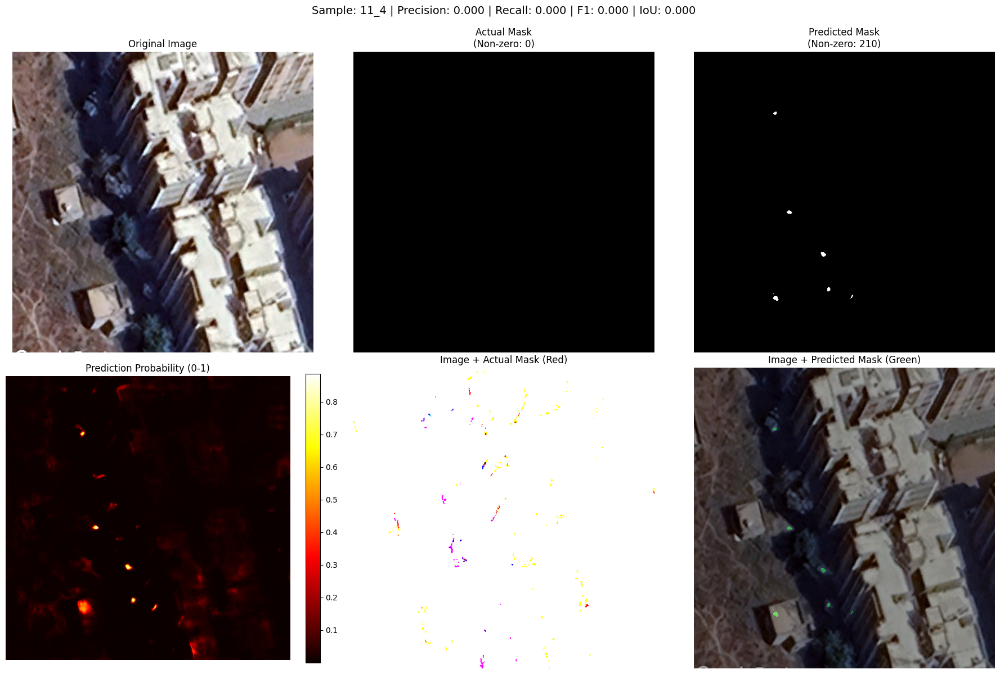

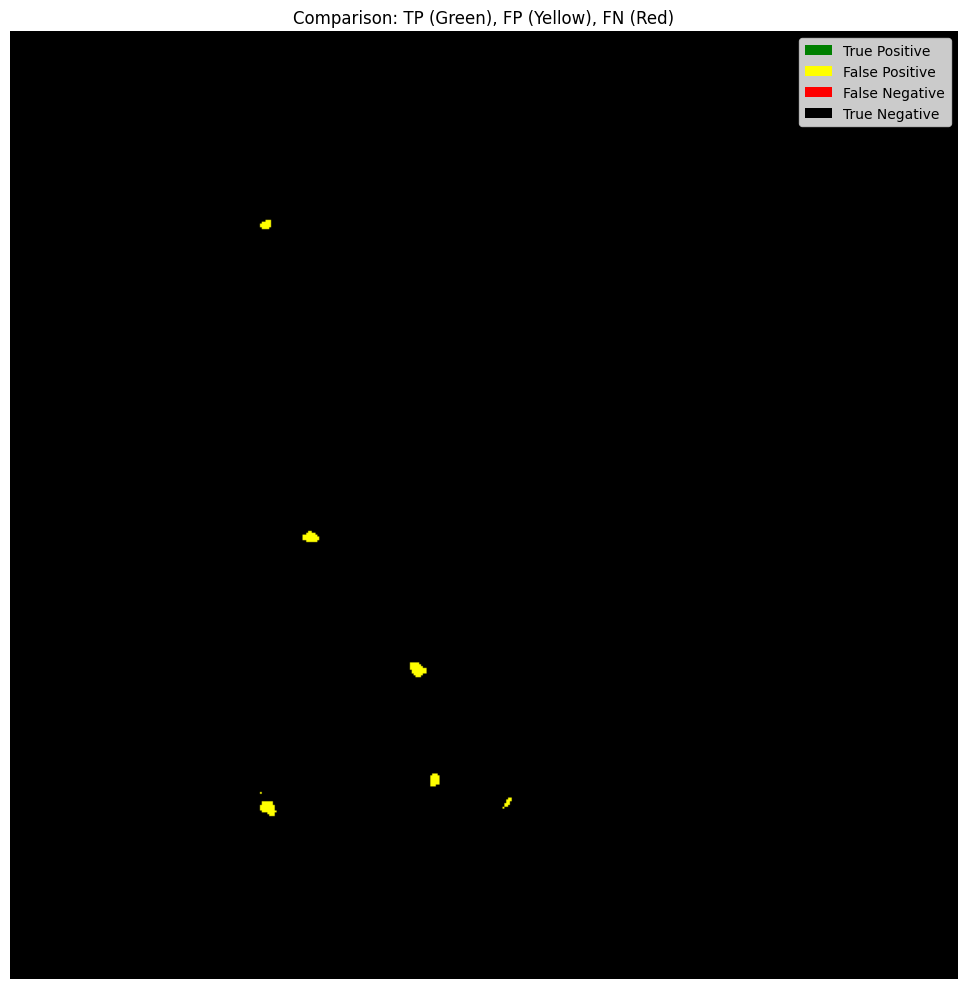

✅ Visualizations saved!


In [ ]:
# Cell 10: Visualize Prediction vs Actual Mask

def visualize_prediction(model, dataset, sample_idx, output_dir, device, threshold=0.5):
    """
    Visualizes the original image, actual mask, predicted mask,
    prediction probability, and overlays for a given sample.
    Also generates a comparison mask (TP, FP, FN).
    """
    # Get sample data
    sample = dataset[sample_idx]

    # Get original image and mask paths
    images_dir = dataset.images_dir # Assuming images_dir is accessible from dataset
    masks_dir = dataset.masks_dir # Assuming masks_dir is accessible from dataset
    image_path = Path(images_dir) / f"{sample['name']}.png"
    mask_path = Path(masks_dir) / f"{sample['name']}.npy"

    original_image = np.array(Image.open(image_path).convert('RGB'))
    original_mask = np.load(mask_path)
    if original_mask.max() > 1:
        original_mask = original_mask / 255.0
    original_mask = original_mask.astype(np.float32)

    # Preprocess image for inference
    transform = A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

    image_np = original_image.astype(np.uint8)
    transformed = transform(image=image_np)
    image_tensor = transformed['image'].unsqueeze(0).to(device)

    # Make prediction
    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        pred_prob = torch.sigmoid(output).cpu().numpy()[0, 0]
        pred_mask = (pred_prob > threshold).astype(np.float32)

    print(f"Sample: {sample['name']}")
    print(f"Image shape: {original_image.shape}")
    print(f"Predicted mask shape: {pred_mask.shape}")
    print(f"Actual mask shape: {original_mask.shape}")

    # Calculate metrics for this sample
    pred_flat = pred_mask.flatten()
    target_flat = original_mask.flatten()
    precision = precision_score(target_flat, pred_flat, zero_division=0)
    recall = recall_score(target_flat, pred_flat, zero_division=0)
    f1 = f1_score(target_flat, pred_flat, zero_division=0)
    iou = jaccard_score(target_flat, pred_flat, zero_division=0)

    print(f"\nMetrics for this sample:")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall: {recall:.4f}")
    print(f"  F1 Score: {f1:.4f}")
    print(f"  IoU: {iou:.4f}")


    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Original Image
    axes[0, 0].imshow(original_image)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')

    # Actual Mask
    axes[0, 1].imshow(original_mask, cmap='gray')
    axes[0, 1].set_title(f'Actual Mask\n(Non-zero: {np.count_nonzero(original_mask)})')
    axes[0, 1].axis('off')

    # Predicted Mask
    axes[0, 2].imshow(pred_mask, cmap='gray')
    axes[0, 2].set_title(f'Predicted Mask\n(Non-zero: {np.count_nonzero(pred_mask)})')
    axes[0, 2].axis('off')

    # Prediction Probability
    axes[1, 0].imshow(pred_prob, cmap='hot')
    axes[1, 0].set_title('Prediction Probability (0-1)')
    axes[1, 0].axis('off')
    plt.colorbar(axes[1, 0].images[0], ax=axes[1, 0], fraction=0.046)

    # Overlay on Image - Actual
    overlay = original_image.copy().astype(np.float32)
    if original_mask.max() > 0:
        mask_colored = np.zeros_like(original_image)
        mask_colored[original_mask > 0.5] = [255, 0, 0]  # Red for actual
        overlay = overlay * 0.6 + mask_colored * 0.4
        overlay = overlay.astype(np.uint8)
    axes[1, 1].imshow(overlay)
    axes[1, 1].set_title('Image + Actual Mask (Red)')
    axes[1, 1].axis('off')

    # Prediction Overlay on Image
    pred_overlay = original_image.copy().astype(np.float32)
    if pred_mask.max() > 0:
        pred_colored = np.zeros_like(original_image)
        pred_colored[pred_mask > 0.5] = [0, 255, 0]  # Green for predicted
        pred_overlay = pred_overlay * 0.6 + pred_colored * 0.4
        pred_overlay = pred_overlay.astype(np.uint8)
    axes[1, 2].imshow(pred_overlay)
    axes[1, 2].set_title('Image + Predicted Mask (Green)')
    axes[1, 2].axis('off')

    plt.suptitle(f'Sample: {sample["name"]} | Precision: {precision:.3f} | Recall: {recall:.3f} | F1: {f1:.3f} | IoU: {iou:.3f}',
                 fontsize=14, y=0.995)

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'prediction_comparison_{sample["name"]}.png'), dpi=150, bbox_inches='tight')
    plt.show()

    # Create comparison mask (TP=green, FP=yellow, FN=red)
    comparison_mask = np.zeros((*original_mask.shape, 3), dtype=np.uint8)
    comparison_mask[(original_mask > 0.5) & (pred_mask > 0.5)] = [0, 255, 0]  # TP: Green
    comparison_mask[(original_mask <= 0.5) & (pred_mask > 0.5)] = [255, 255, 0]  # FP: Yellow
    comparison_mask[(original_mask > 0.5) & (pred_mask <= 0.5)] = [255, 0, 0]  # FN: Red

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(comparison_mask)
    ax.set_title('Comparison: TP (Green), FP (Yellow), FN (Red)')
    ax.axis('off')

    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='green', label='True Positive'),
        Patch(facecolor='yellow', label='False Positive'),
        Patch(facecolor='red', label='False Negative'),
        Patch(facecolor='black', label='True Negative')
    ]
    ax.legend(handles=legend_elements, loc='upper right')

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'comparison_mask_{sample["name"]}.png'), dpi=150, bbox_inches='tight')
    plt.show()

    print("✅ Visualizations saved!")

# Load best model (outside the function)
best_model_path = os.path.join(output_dir, 'best_model.pth')
if not os.path.exists(best_model_path):
    raise FileNotFoundError(f"Best model checkpoint not found at {best_model_path}")

checkpoint = torch.load(best_model_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f"✅ Loaded best model from epoch {checkpoint['epoch']} (IoU: {checkpoint['val_iou']:.4f})")

# Select a sample from validation set for visualization
val_indices = val_dataset.indices
sample_idx = random.choice(val_indices)

# Call the visualization function
visualize_prediction(model, full_dataset, sample_idx, output_dir, device)

Sample: 223_3
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)

Metrics for this sample:
  Precision: 0.9471
  Recall: 0.9303
  F1 Score: 0.9386
  IoU: 0.8844


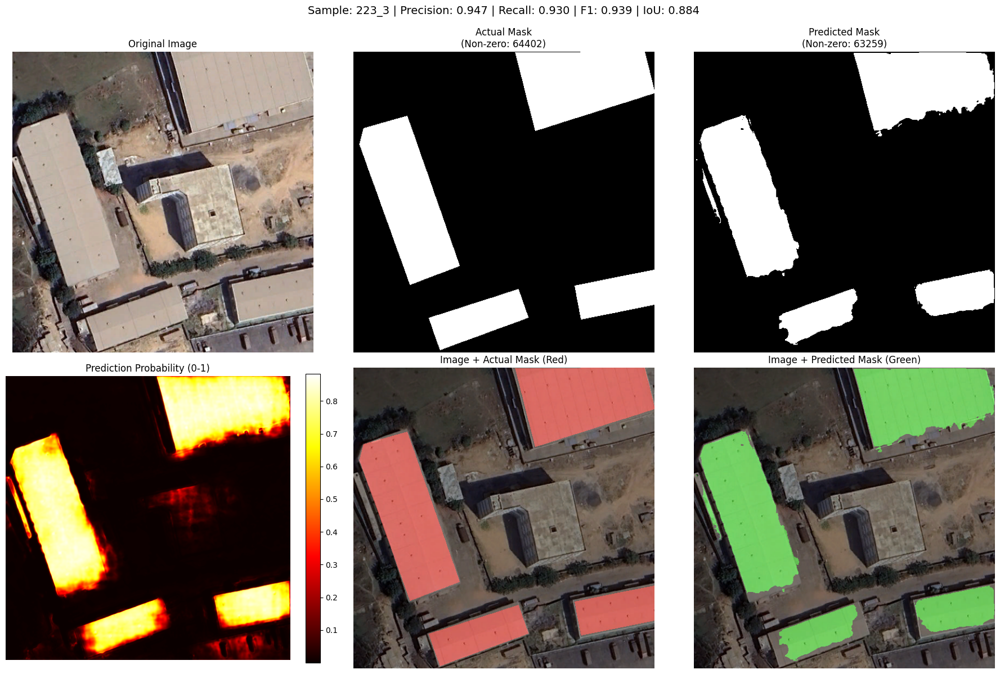

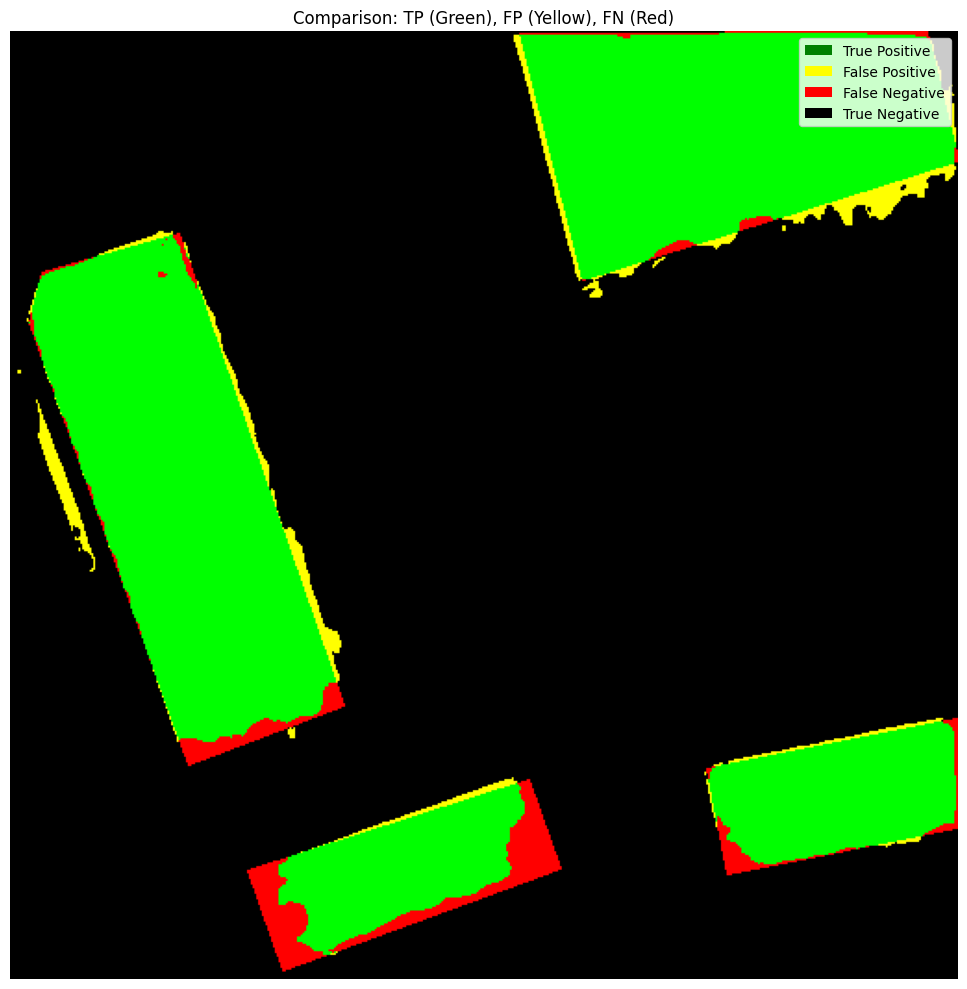

✅ Visualizations saved!


In [ ]:
sample_idx = random.choice(val_indices)
visualize_prediction(model, full_dataset, sample_idx, output_dir, device)

Sample: 415_1
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)

Metrics for this sample:
  Precision: 0.6854
  Recall: 0.9431
  F1 Score: 0.7939
  IoU: 0.6582


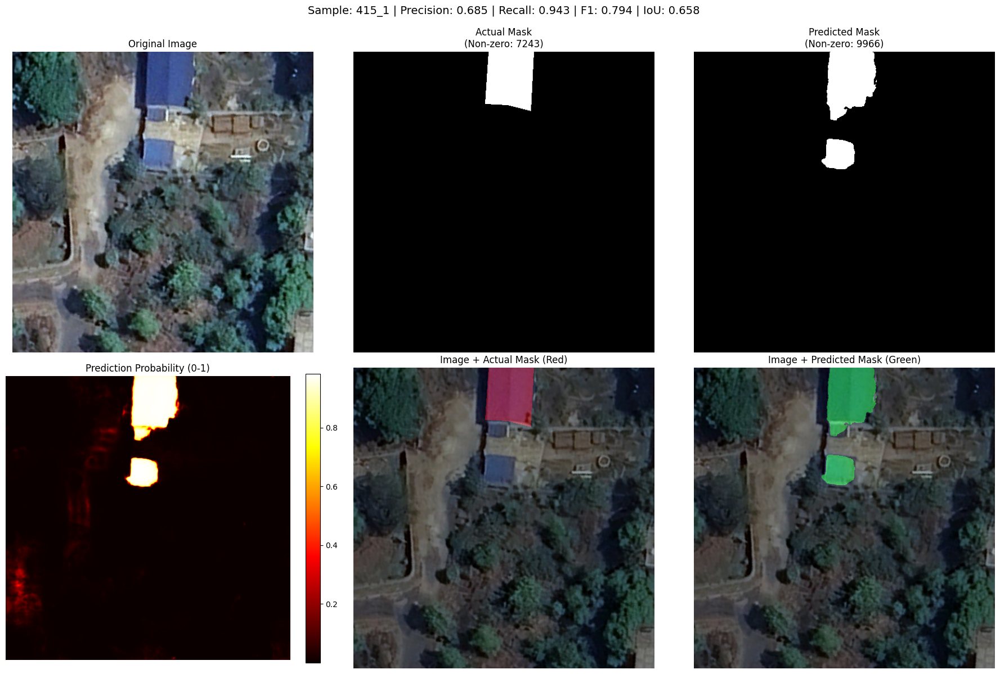

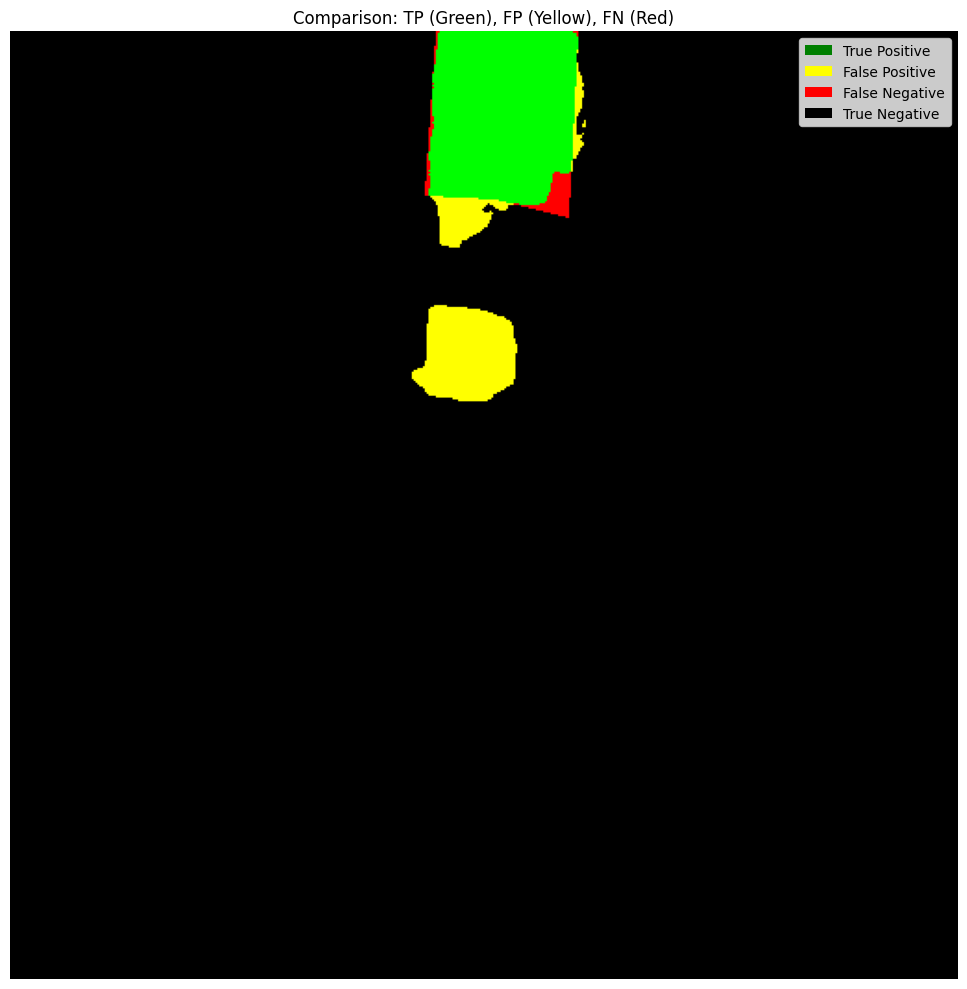

✅ Visualizations saved!


In [ ]:
sample_idx = random.choice(val_indices)
visualize_prediction(model, full_dataset, sample_idx, output_dir, device)

Sample: 21_2
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)

Metrics for this sample:
  Precision: 0.5244
  Recall: 0.4577
  F1 Score: 0.4888
  IoU: 0.3234


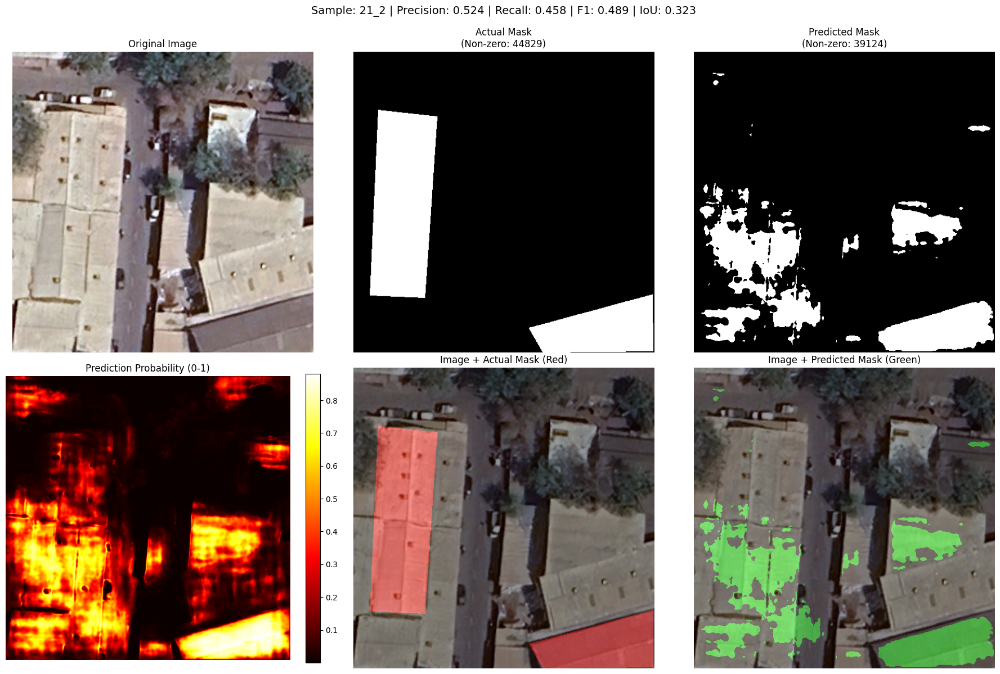

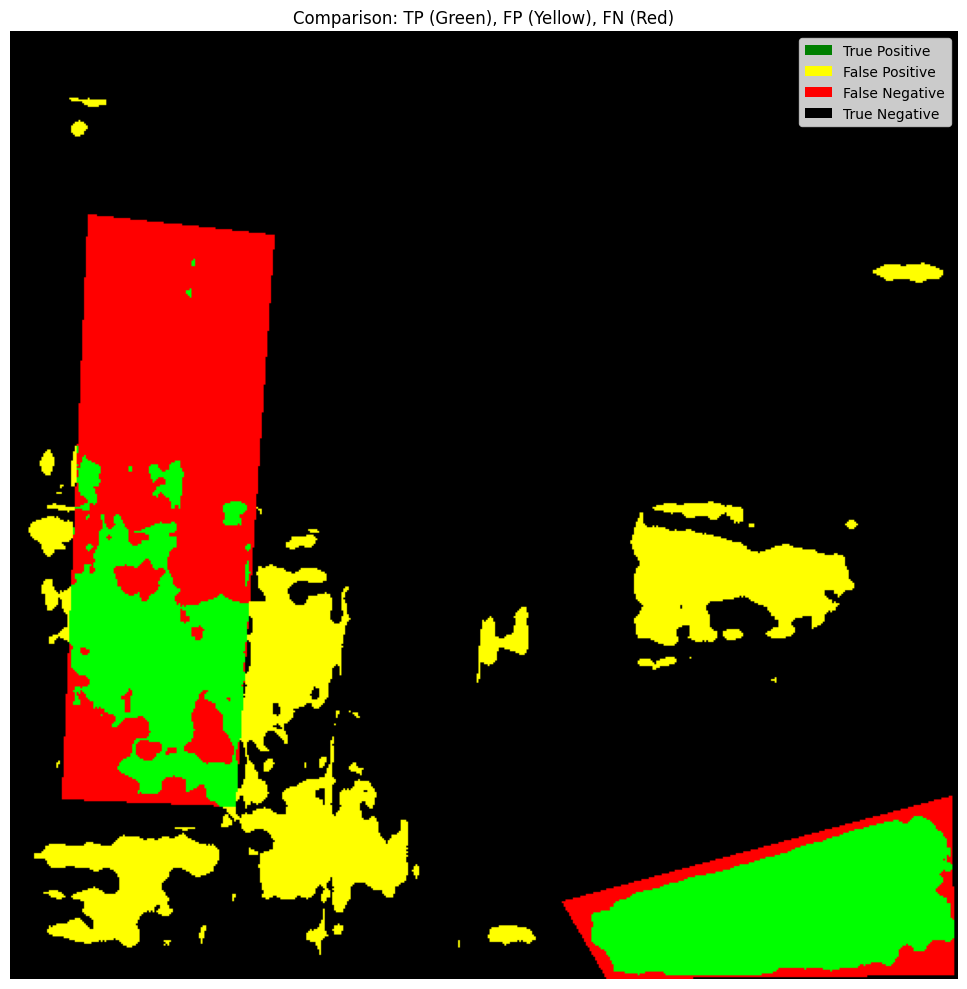

✅ Visualizations saved!


In [ ]:
sample_idx = random.choice(val_indices)
visualize_prediction(model, full_dataset, sample_idx, output_dir, device)

Sample: 224_2
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)

Metrics for this sample:
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
  IoU: 0.0000


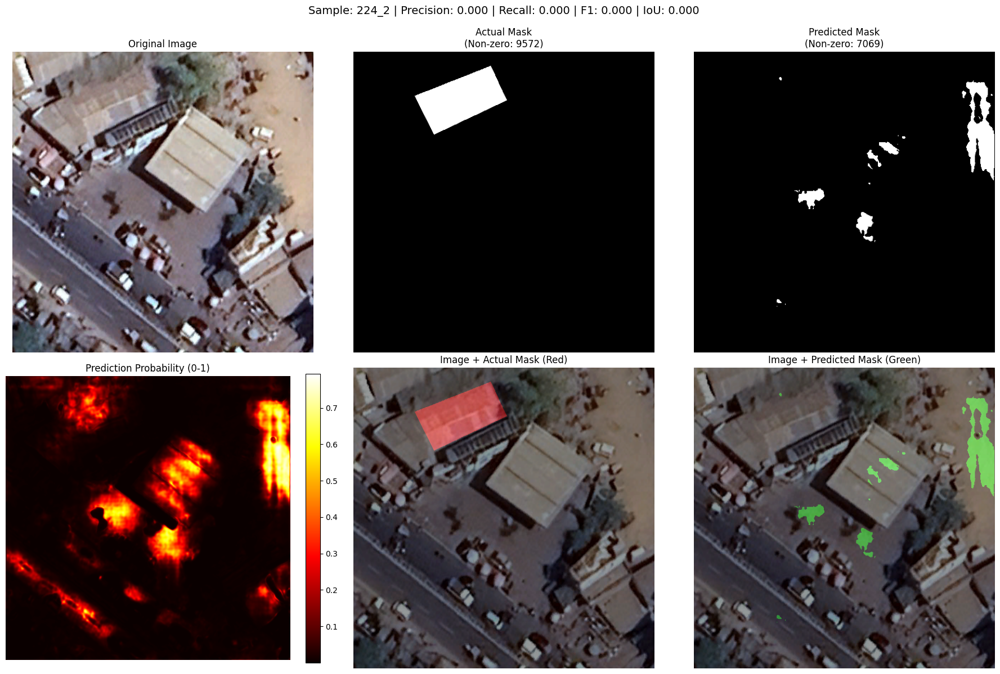

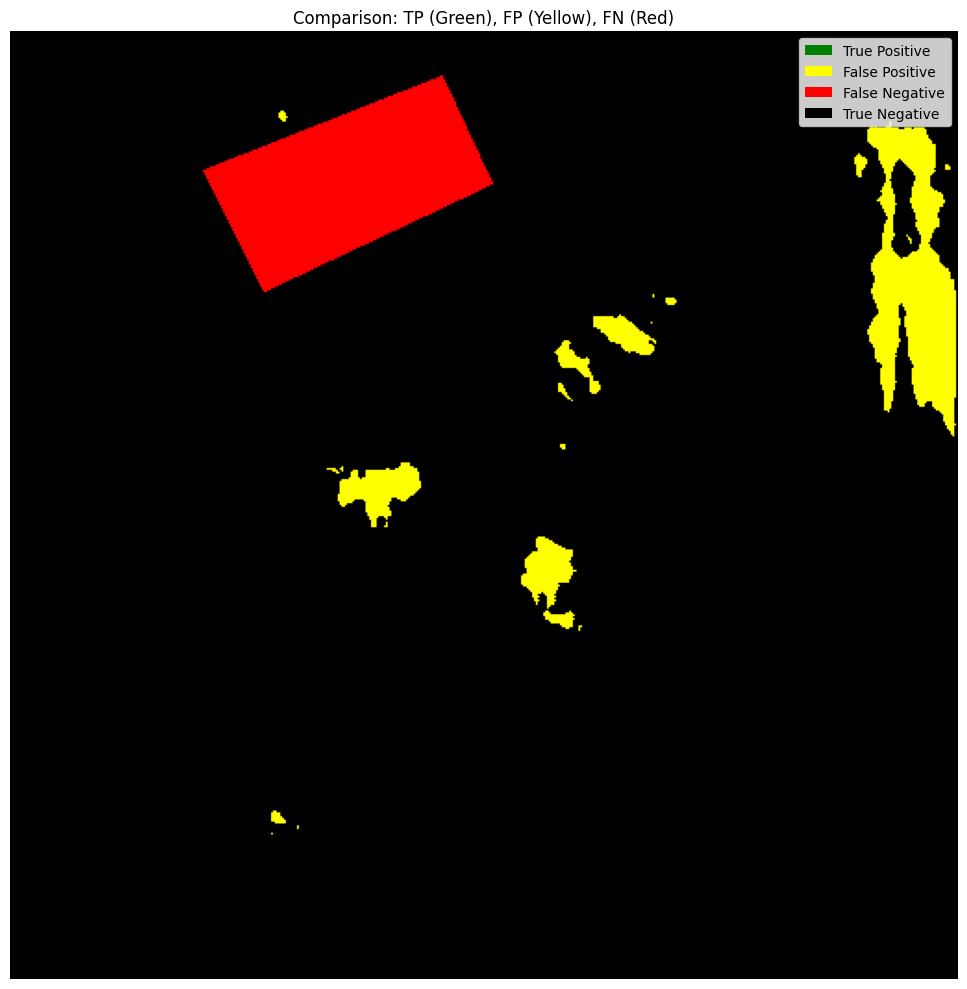

✅ Visualizations saved!


In [ ]:
sample_idx = random.choice(val_indices)
visualize_prediction(model, full_dataset, sample_idx, output_dir, device)

Sample: 225_1
Image shape: (512, 512, 3)
Predicted mask shape: (512, 512)
Actual mask shape: (512, 512)

Metrics for this sample:
  Precision: 0.6568
  Recall: 0.6930
  F1 Score: 0.6744
  IoU: 0.5088


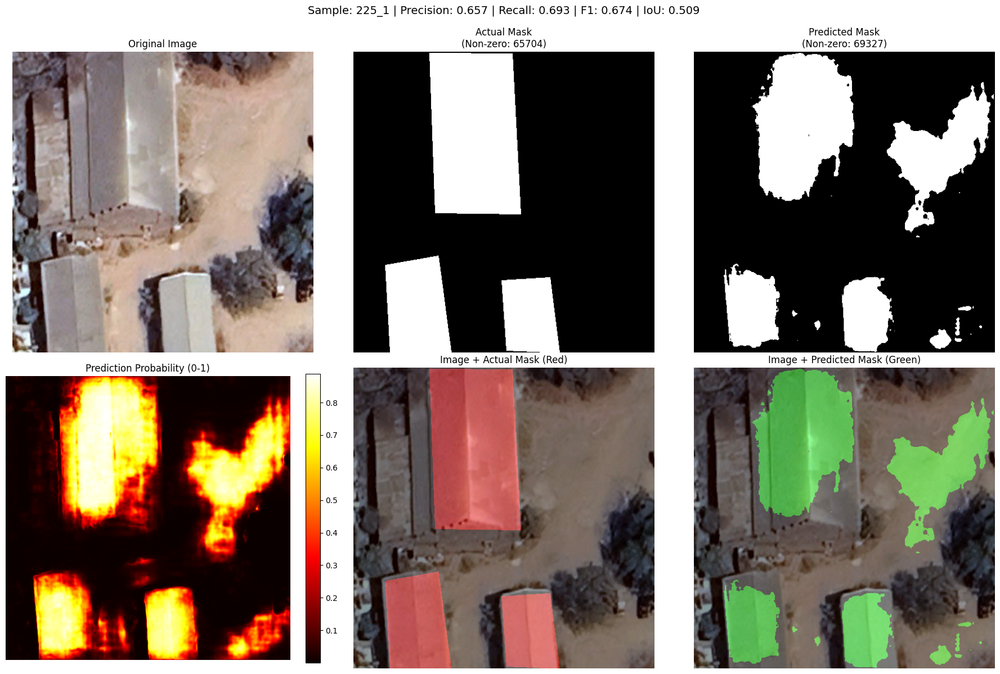

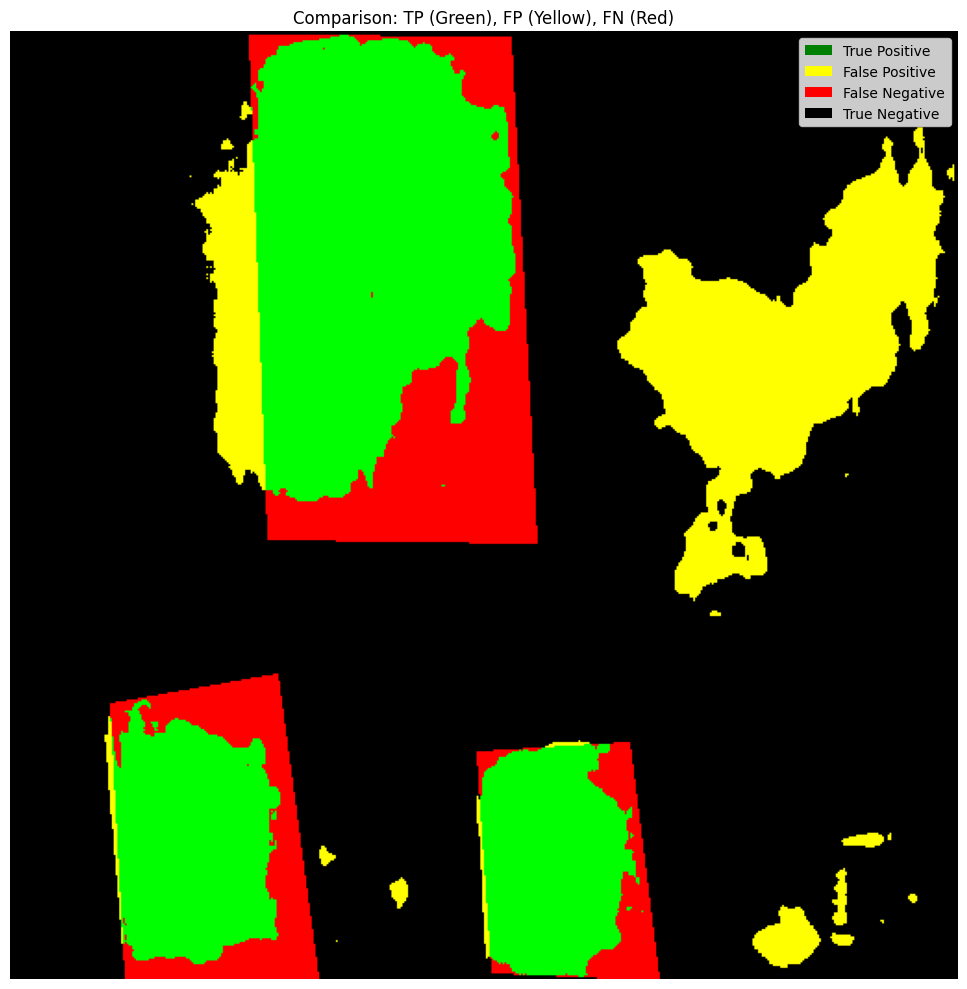

✅ Visualizations saved!


In [ ]:
sample_idx = random.choice(val_indices)
visualize_prediction(model, full_dataset, sample_idx, output_dir, device)

In [ ]:
# sample_idx = random.choice(val_indices)
# visualize_prediction(model, full_dataset, sample_idx, output_dir, device)